# Otoczka wypukła

In [2]:
import numpy as np
import pandas as pd
from bitalg.tests.test2 import Test
from bitalg.visualizer.main import Visualizer
import random
import copy
import time
import functools
import decimal
decimal.getcontext().prec = 64

### Przykładowe zastosowanie narzędzia do wizualizacji

In [76]:
def draw_example_1():
    vis = Visualizer()

    # point = (x, y)
    points = [
        (-62.781083483620016, 9.295526540248986),
        (-10.543100198806997, -26.080520917553812),
        (-81.64932184252287, -74.42163273030921),
        (-36.297317058417946, -72.91194239793609),
        (37.795092197502356, 57.71110085986143),
        (62.511149567563905, -29.172821102708937),
        (21.82806671019955, 2.647377124715007),
        (-46.24539555503924, 42.65521594922478),
        (-77.92302295134137, -7.666110427206263),
        (25.85862324263843, 62.49564419388622),
        (-27.71649622636616, -67.33453457840331),
        (94.83039177581244, -55.52473300629532),
        (-26.29675918891381, -51.30150933048958),
        (-70.11654929355294, 16.723865705806816),
        (26.682887992598097, -65.55763984116587),
        (57.03377667841906, -55.56635171240132),
        (-16.053624841650247, -42.333295668531456),
        (-56.810858686395505, -37.41219002465095),
        (15.604076302407279, -24.85779870929437),
        (-71.77261869976445, -12.306083264402673),
    ]
    # line_segment = ((x1, y1), (x2, y2))
    line_segments = [
        ((-81.64932184252287, -74.42163273030921), (-36.297317058417946, -72.91194239793609)),
        ((-36.297317058417946, -72.91194239793609), (26.682887992598097, -65.55763984116587)),
        ((26.682887992598097, -65.55763984116587), (94.83039177581244, -55.52473300629532)),
        ((94.83039177581244, -55.52473300629532), (37.795092197502356, 57.71110085986143)),
        ((37.795092197502356, 57.71110085986143), (25.85862324263843, 62.49564419388622)),
        ((25.85862324263843, 62.49564419388622), (-46.24539555503924, 42.65521594922478)),
        ((-46.24539555503924, 42.65521594922478), (-70.11654929355294, 16.723865705806816)),
        ((-70.11654929355294, 16.723865705806816), (-77.92302295134137, -7.666110427206263)),
        ((-77.92302295134137, -7.666110427206263), (-81.64932184252287, -74.42163273030921)),
    ]
    vis.add_point(points, color="green")
    vis.add_line_segment(line_segments, color="blue")
    vis.show()

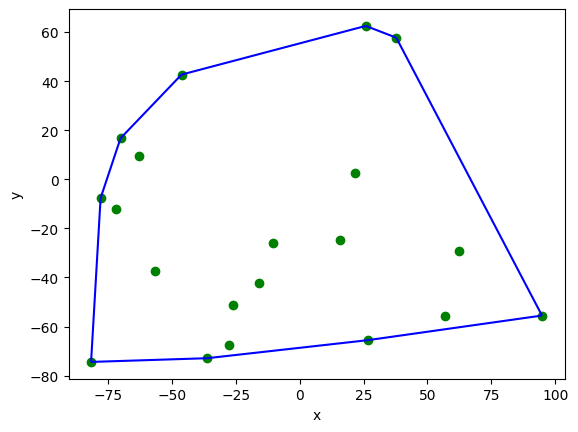

In [77]:
draw_example_1()

### Wprowadzenie

Czym jest otoczka wypukła?  
Podzbiór płaszczyzny $Q$ nazywamy wypukłym iff, gdy dla dowolnej pary punktów $p, q \in Q$ odcinek $\overline{pq}$ jest całkowicie zawarty w $Q$.  
Otoczka wypukła $\mathcal{CH}(Q)$ zbioru $Q$ jest najmniejszym wypukłym zbiorem zawierającym $Q$.

### Zastosowania otoczku wypukłej

Otoczki wypukłe - w szczególności otoczki wypukłe w przestrzeni trójwymiarowej - są spotykane w różnych zastosowaniach. Na przykład używa się ich do przyspieszania wykrywania kolizji w animacji komputerowej. Przepuśćmy, że chcemy sprawdzić, czy dwa obiekty $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się. Jeśli przez większość czasu odpowiedź na to pytanie jest negatywna, to opłaca się następująca strategia. Przybliżamy obiekty przez prostrze obiekty $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$, które zawierały orginały. Jeśli chcemy sprwadzić, czy $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się, najpierw sprawdzamy, czy przecinają się $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$. Jeśli występuje ten przypadek, to powinniśmy wykonać test na orginalnych obiektach, który jest przepuszczalnie znacznie kosztowniejszy.  
Sprawdzanie przecięcia otoczek wypukłych jest bardziej skomplikowane niż dla sfer - choć mimo to łatwiejsze niż dla obiektów niewypukłych - ale otoczki wypukłe mogą dużo lepiej przybliżać większość obiektów.

## Generowanie losowych punktów na płaszczyźnie 

Zapoznaliśmy się i wiemy jak generowac losowe punkty na płaszczyźnie z laboratorium I (współrzędne rzeczywiste typu *double* - podwójna precyzja obliczeń). Przygotuj zestawy punktów, które będzie można użyć jako testowe dla algorytmów obliczania otoczki wypukłej.

Uzupełnij funkcję ```generate_uniform_points```.

In [78]:
def generate_uniform_points(left=-100, right=100, n=100):
    random.seed()
    points = []
    diff = right-left
    for i in range(n):
        x = random.random()*diff+left
        y = random.random()*diff+left
        points.append((x, y))
    return points
        
    """
    Funkcja generuje równomiernie n punktów na kwadwratowym
    obszarze od left do right (jednakowo na osi y)
    o współrzędnych rzeczywistych
    :param left: lewy kraniec przedziału
    :param right: prawy kraniec przedziału
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
             np. [(x1, y1), (x2, y2), ... (xn, yn)]
    """
    raise Exception("Unimplemented")

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D o współrzędnych z przedziału $x \in \langle -100,100 \rangle$ oraz $y \in \langle -100,100\rangle$.

In [79]:
points_a = generate_uniform_points(-100, 100, 100)

Zwizualizuj wygenerowane punkty.

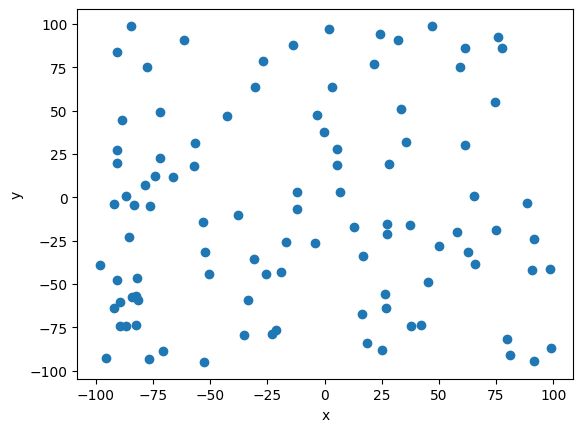

In [80]:
# visualize(points_a)
vis = Visualizer()
vis.add_point(points_a)
vis.show()


Uzupełnij funkcję ```generate_circle_points```.

In [81]:
def generate_circle_points(O, R, n=100):
    points=[]
    step = 1/n
    for i in range (n):
        t = step * i
        x = R*np.cos(t*np.pi*2)
        y = R*np.sin(t*np.pi*2)
        points.append((x,y))
    return points
    """
    Funkcja generuje jednostajnie n punktów na okręgu o środku O i promieniu R
    :param O: krotka współrzędnych x, y określająca środek okręgu
    :param R: promień okręgu
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    """
    raise Exception("Unimplemented")

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na okręgu o środku $O = (0,0)$ i promieniu $R = 10$.

In [82]:
points_b = generate_circle_points((0, 0), 10, 100)

Zwizualizuj wygenerowane punkty.

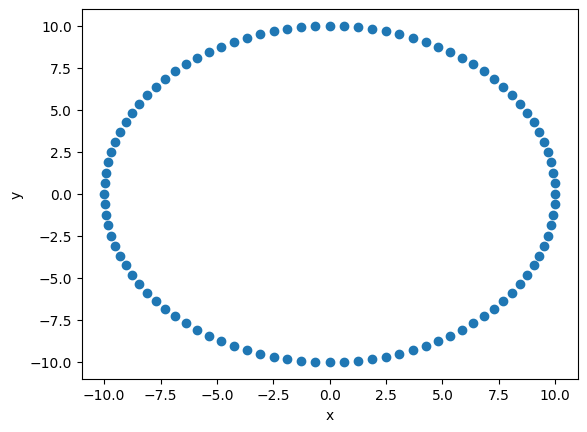

In [83]:
# visualize(points_b)
vis.clear()
vis.add_point(points_b)
vis.show()

Jak można było zauważyć, to funkcje ```generate_uniform_points``` oraz ```generate_circle_points``` są takie same jak w laboratorium I.

Uzupełnij funkcję ```generate_rectangle_points```.

In [84]:
def generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=100):
    random.seed()
    points=[]
    for i in range (n):
        dist=random.random()*80
        if dist<20:
            x=-10
            y=dist-10
            points.append((x,y))
        elif dist<40:
            x=dist-30
            y=10
            points.append((x,y))
        elif dist<60:
            x=10
            y=10-(dist-40)
            points.append((x,y))
        else:
            x=10-(dist-60)
            y=-10
            points.append((x,y))
    return points
            
    
    '''
    Funkcja generuje n punktów na obwodzie prostokąta
    o wierzchołkach w punktach a, b, c i d
    :param a: lewy-dolny wierzchołek prostokąta
    :param b: prawy-dolny wierzchołek prostokąta
    :param c: prawy-górny wierzchołek prostokąta
    :param d: lewy-górny wierzchołek prostokąta
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    raise Exception("Unimplemented")


<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na obwodzie prostokąta, którego wyznaczają wierzchołki
$(-10,-10), (10,-10), (10,10)$ oraz $(-10,10)$.

In [85]:
points_c = generate_rectangle_points(
    (-10, -10), (10, -10), (10, 10), (-10, 10), 100)

Zwizualizuj wygenerowane punkty.

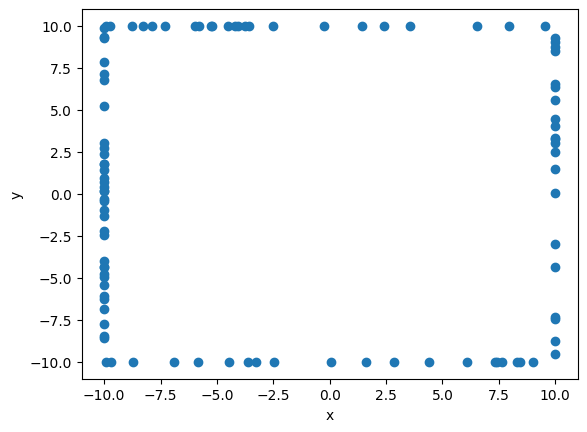

In [86]:
# visualize(points_c)
vis.clear()
vis.add_point(points_c)
vis.show()

Uzupełnij funkcję ```generate_square_points```.

In [87]:
def generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10),
                           axis_n=25, diag_n=20):
    random.seed()
    points=[]
    points.append((0,0))
    points.append((0,10))
    points.append((10,0))
    points.append((10,10))
    for i in range (axis_n):
        y=random.random()*10
        points.append((0,y))
    for i in range (axis_n):
        x=random.random()*10
        points.append((x,0))
    for i in range (diag_n):
        x=random.random()*10
        y=x
        points.append((x,y))
    for i in range (diag_n):
        x=random.random()*10
        y=10-x
        points.append((x,y))
    return points
    
    
    '''
    Funkcja generuje axis_n punktów na dwóch bokach kwadratu
    leżących na osiach x i y oraz diag_n punktów na
    przektąnych kwadratu, którego wyznaczają punkty
    a, b, c i d.
    :param a: lewy-dolny wierzchołek kwadratu
    :param b: prawy-dolny wierzchołek kwadratu
    :param c: prawy-górny wierzchołek kwadratu
    :param d: lewy-górny wierzchołek kwadratu
    :param axis_n: ilość generowanych punktów na każdym
                   z dwóch boków kwadratu równoległych do osi x i y
    :param diag_n: ilość generowanych punktów na każdej
                   przekątnej kwadratu
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    raise Exception("Unimplemented")

<span style="color:red">Ćw.</span> Wygeneruj losowe punktów w przestrzeni 2D w następujący sposób: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu, zawierający punkty wyznaczające kwadrat $(0, 0), (10, 0), (10, 10)$ oraz $(0, 10)$.

In [88]:
points_d = generate_square_points(
    (0, 0), (10, 0), (10, 10), (0, 10), 25, 20)

Zwizualizuj wygenerowane punkty.

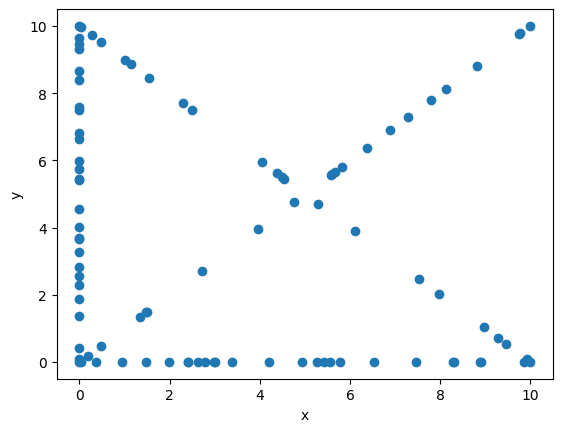

In [89]:
# visualize(points_d)
vis.clear()
vis.add_point(points_d)
vis.show()

## Algorytm Grahama oraz algorytm Jarvisa

Po przygotowaniu przykładowych zbiorów danych i ich zwizualizowaniu, chcemy zobaczyć jak buduje się dla nich otoczka wypukła z wykorzystaniem różnych algortymów.  
W tych dwóch algorytmach potrzebna będzie funkcja którą już dobrze znamy, czyli funkcja, która sprawdza po której stornie prostej znajduje się punkt.  
Dla każdego algorytmu trzeba będzie zaimplementować dwie funkcje obliczające otoczkę wypukłę, ze względu, że jedna z nich będzie miała możliwość wyświetlania kroków postępowania w algorytmie. Druga funkcja będzie uzyteczna do porównywania czasów dla różnych zbiorów danych i względęm algorytmów.  
W graficznej funkcji danego algorytmu, jednym kolorem powinny być zaznaczone wszystkie punkty zbioru wyjściowego, drugim kolorem boki aktualne rozpatrywane, a trzecim boki wielokąta otoczki. Po zakończeniu wyznaczania otoczki, wierzchołki otoczki powinny być wyróżnione (osobnym kolorem bądź kształtem).  

### Algorytm Grahama

Algorytm Grahama tworzy otoczkę wypukłą poprzez utrzymywanie stosu $S$, w którym znajdują się punkty, które mogą, ale nie muszą tworzyć otoczki wypukłej. Za każdym razem jest wstawiany na stos (push) jeden punkt z zbioru punktów $Q$ i jest on usuwany ze stosu (pop), jeżeli nie jest punktem $\mathcal{CH}(Q)$. Kiedy algorytm kończy się, stos $S$ zawiera tylko punkty otoczki wypukłej $\mathcal{CH}(Q)$ w kierunku przeciwnym do ruchu wskazówek zegera.

---

Procedura $\mathtt{Graham-Build(Q)}$ przyjmuje zbiór punktów $Q$, gdzie $|Q| \geq 3$. Wywołuje ona funkcję $\mathtt{TOP(S)}$, która zwraca punkt z góry stosu bez zmieniania $S$ oraz
$\mathtt{NEXT-TO-TOP(S)}$, która zwraca punkt ponieżej góry stosu $S$, bez zmieniania stosu. Funkcja $\mathtt{PUSH(p, S)}$ wstawia punkt $p$ na stos $S$. Funkcja $\mathtt{POP(p, S)}$ usuwa punkt $p$ ze stosu $S$.

$\mathtt{Graham-Build(Q)}$  
1)  niech $p_0$ będzie punktem w zbiorze Q z najmniejszą współrzędną $y$,  
    oraz najmniejszą współrzędną $x$ w przypadku, gdy wiele punktów ma tą samą współrzędną $x$  
    
2)  nich $\mathtt{\langle p_1, p_2, \dots, p_m \rangle}$ będzie pozostałym zbiorem punktów w $Q$ posortowanym  
    zgodnie z przeciwnym ruchem wskazówek zegara wokół punktu $p_0$  
    (jeżeli więcej niż jeden punkt ma ten sam kąt to usuwamy wszystkie punkty  
     z wyjątkiem tego najbardziej oddalonego od $p_0$)  
3) stwórz pusty stos $S$  
4) $\mathtt{PUSH(p_0, S)}$
5) $\mathtt{PUSH(p_1, S)}$
6) $\mathtt{PUSH(p_2, S)}$
7) **for** $i = 3$ **to** m  
8) &emsp;**while** kąt utworzony przez $\mathtt{NEXT-TO-TOP(S)}$, $\mathtt{TOP(S)}$ oraz $p_i$ tworzy lewostronny skręt
9) &emsp;&emsp;$\mathtt{POP(S)}$
10) &emsp;$\mathtt{PUSH(p_i, S)}$
11) **return** $S$


---

Lewostronny skręt oznacza, że dla trzech kolejnych punktów $a, b, c$, punkt $b$ leży po lewej stronie prostej $ac$.  
  

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama.

In [90]:

def Start_point (Q):
    start=Q[0]
    start_idx=0
    for i in range (1,len(Q)):
        if Q[i][1]<start[1]:
            start=Q[i]
            start_idx=i
        elif Q[i][1]==start[1]:
            if Q[i][0]<start[0]:
                start=Q[i]
                start_idx=i
    return start,start_idx


def orient (a,b,c):
    # Występuje tu zamiana typu danych na dokładność do 64 liczb miejsc po przecinku
    eps=1e-30
    new_a=(decimal.Decimal(a[0]),decimal.Decimal(a[1]))
    new_b=(decimal.Decimal(b[0]),decimal.Decimal(b[1]))
    new_c=(decimal.Decimal(c[0]),decimal.Decimal(c[1]))
    det=(new_b[0]-new_a[0])*(new_c[1]-new_b[1])-(new_b[1]-new_a[1])*(new_c[0]-new_b[0])
    if abs(det)<eps:
        return 0
    elif det>0:
        return 1
    else:
        return -1


def further (a,b,c):
    if a[0]==b[0]:
        if abs(a[1]-b[1])>abs(a[1]-c[1]):
            return True
        else:
            return False
    else:
        if abs(a[0]-b[0])>abs(a[0]-c[0]):
            return True
        else:
            return False


def ComparePoints(a,b):
    first=a[1]
    second=a[0]
    third=b[0]
    orientation=orient(first,second,third)
    if orientation>0 or (orientation==0 and further(first,second,third)==True):
        return -1
    else:
        return 1
    

def Sort_points (Q,start,start_idx):
    if len(Q)==1: return Q,[]
    K=copy.deepcopy(Q)
    K.pop(start_idx)    
    K_with_start=[]
    for i in range (len(K)):
        K_with_start.append((K[i],Q[start_idx]))
    K_with_start=sorted(K_with_start, key=functools.cmp_to_key(ComparePoints))
    for i in range (len(K_with_start)):
        K[i]=K_with_start[i][0]
    Q_sorted=[Q[start_idx],K[0]]
    Q_eliminated=[]
    for i in range (1,len(K)):
        if orient(Q[start_idx],K[i],K[i-1])==0:
            Q_eliminated.append(K[i])
        else:
            Q_sorted.append(K[i])
    return Q_sorted, Q_eliminated


def Less_than_4(Q,eliminated):
    convex_hull=[]
    if len(eliminated)==0:
        return Q,convex_hull
    else:
        for i in range (len(Q)):
            if eliminated[0]!=Q[i]:
                convex_hull.append(Q[i])
        return convex_hull,eliminated


def Get_convex_hull(Q,eliminated):
    not_convex_hull=eliminated.copy()
    convex_hull=[Q[0],Q[1],Q[2]]
    i=3
    t=2
    while i<len(Q):
        if orient(convex_hull[t-1],convex_hull[t],Q[i])>0:
            convex_hull.append(Q[i])
            t+=1
            i+=1
        else:
            not_convex_hull.append(convex_hull[-1])
            convex_hull.pop()
            t-=1
    return convex_hull,not_convex_hull



def graham_algorithm(Q, all_points=False):
    start,start_idx=Start_point(Q)
    Q,eliminated=Sort_points(Q,start,start_idx)
    if len(Q)<4:
        convex_hull,rest=Less_than_4(Q,eliminated)
    else:
        convex_hull,rest=Get_convex_hull(Q,eliminated)
    if all_points==False:
        return convex_hull
    else:
        return convex_hull,rest
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    raise Exception("Unimplemented")

Przetestuj swoją implementacje algorytmu Grahama, by sprawdzić czy poprawnie obliczana jest otoczka.

In [91]:
Test().runtest(1, graham_algorithm)

Lab 2, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 49.562s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama z dodatkową opcją wyświetlania kroków algorytmu.

In [92]:

def graham_algorithm_draw(Q):
    start,start_idx=Start_point(Q)
    green,red=Sort_points(Q,start,start_idx)
    vis.clear()
    vis.add_line_segment([(green[i], Q[start_idx]) for i in range(len(green))])
    vis.add_point(green, color=['green'])
    vis.add_point(red, color=['red'])
    vis.add_point(Q[start_idx], color=['purple'])
    vis.show()
    
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama oraz
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci (tablica punktów w postaci krotek współrzędnych,
                                wizualizer pokazujący kroki algorytmu) 
    '''
    #raise Exception("Unimplemented")

In [93]:
def Less_than_4_draw(Q,not_convex_hull):
    vis.clear()
    if len(not_convex_hull)==0:
        convex_hull=Q.copy()
    else:
        convex_hull=[]
        for i in range (len(Q)):
            if not_convex_hull[0]!=Q[i]:
                convex_hull.append(Q[i])
    if len(convex_hull)==3:
        vis.add_line_segment([(Q[0], Q[1]),(Q[1], Q[2]),(Q[2], Q[0])] , color=['blue'])
    elif len(convex_hull)==2:
        vis.add_line_segment([(Q[0], Q[1])] , color=['blue'])
    vis.add_point(convex_hull, color=['blue'])
    if len(not_convex_hull)!=0:
        vis.add_point(not_convex_hull, color=['orange'])
    vis.show()


def Vis_hull_graham(convex_hull,not_convex_hull,Q,to_start,is_good=False,start=False,last=False):
    vis.clear()
    if start==True:
        vis.add_line_segment([(convex_hull[i], convex_hull[i+1]) for i in range(2)], color=['blue'])
        vis.add_point(convex_hull, color=['blue'])
    elif last==True:
        vis.add_line_segment([(convex_hull[i], convex_hull[i+1]) for i in range(len(convex_hull)-1)], color=['blue'])
        vis.add_line_segment([(convex_hull[len(convex_hull)-1], convex_hull[0])], color=['blue'])
        vis.add_point(convex_hull, color=['blue'])
    else:
        vis.add_line_segment([(convex_hull[i], convex_hull[i+1]) for i in range(len(convex_hull)-2)], color=['blue'])
        vis.add_point(convex_hull[:-1], color=['blue'])
        if is_good==True:
            vis.add_line_segment([(convex_hull[-2], convex_hull[-1]),(convex_hull[-1], Q[to_start])] , color=['green'])
            vis.add_point([convex_hull[-1]], color=['green'])
        else:
            vis.add_line_segment([(convex_hull[-2], convex_hull[-1]),(convex_hull[-1],  Q[to_start])] , color=['red'])
            vis.add_point([convex_hull[-1]], color=['red'])
        vis.add_point([Q[to_start]], color=['purple'])
    vis.add_point(not_convex_hull, color=['orange'])
    if to_start<len(Q)-1:
        vis.add_point(Q[to_start+1:], color=['black'])
    vis.show()
    

def Draw_convex_hull(Q,eliminated):
    not_convex_hull=eliminated.copy()
    if len(Q)<4:
        Less_than_4_draw(Q,not_convex_hull)
    else:
        convex_hull=[Q[0],Q[1],Q[2]]
        i=3
        t=2
        Vis_hull_graham(convex_hull,not_convex_hull,Q,i-1,start=True)
        while i<len(Q):
            if orient(convex_hull[t-1],convex_hull[t],Q[i])>0:
                Vis_hull_graham(convex_hull,not_convex_hull,Q,i,is_good=True)
                convex_hull.append(Q[i])
                t+=1
                i+=1
            else:
                Vis_hull_graham(convex_hull,not_convex_hull,Q,i,is_good=False)
                not_convex_hull.append(convex_hull[-1])
                convex_hull.pop()
                t-=1
        Vis_hull_graham(convex_hull,not_convex_hull,Q,i,last=True)

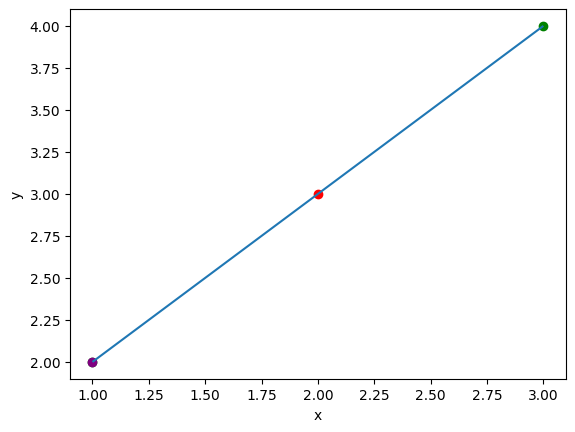

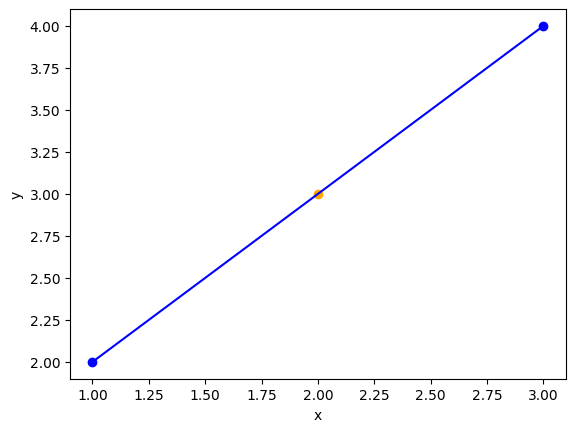

In [94]:
temp=[(1,2),(2,3),(3,4)]
temp_on,temp_not=graham_algorithm(temp,True)
graham_algorithm_draw(temp)
start,start_idx=Start_point(temp)
temp_on,temp_not=Sort_points(temp,start,start_idx)
Draw_convex_hull(temp_on,temp_not)

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [95]:
graham_points_a_hull_100,graham_points_a_hull_not_100 = graham_algorithm(points_a,True)

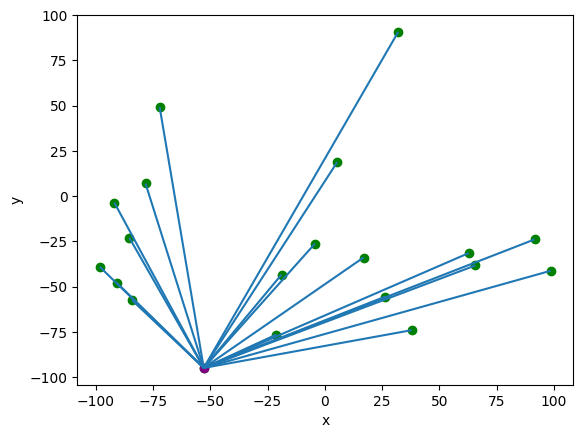

In [96]:
graham_algorithm_draw(points_a[:20])

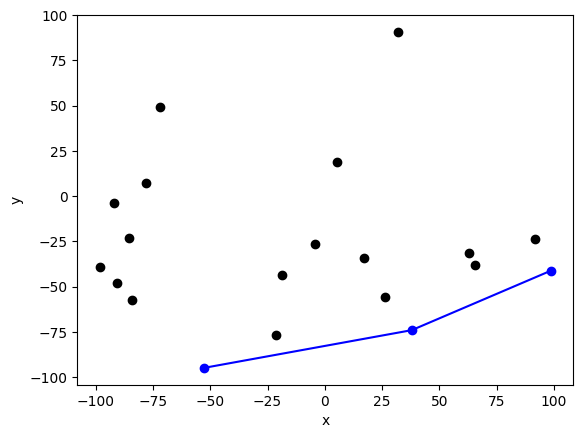

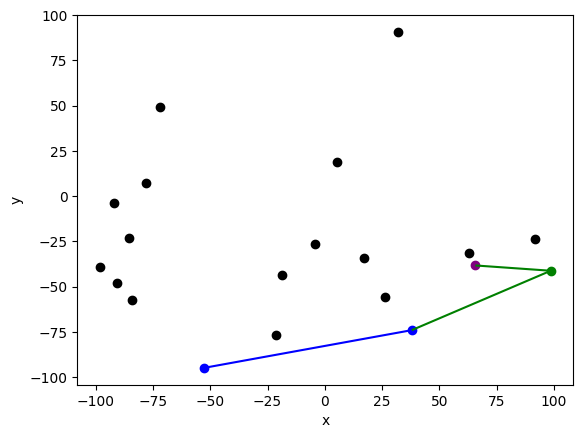

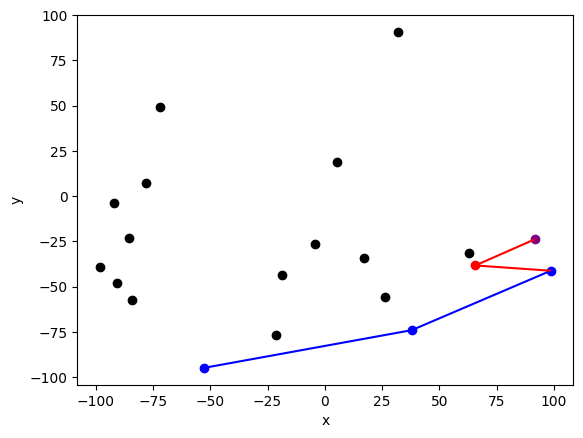

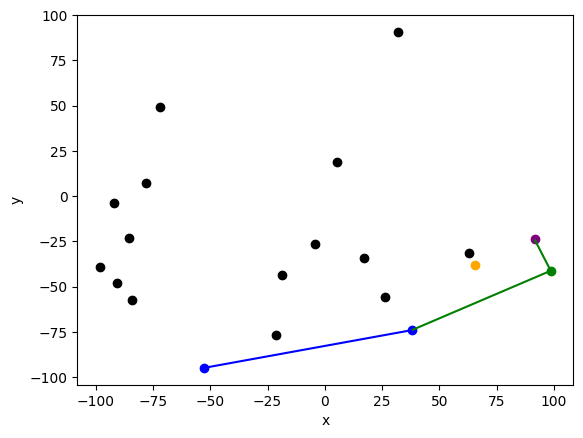

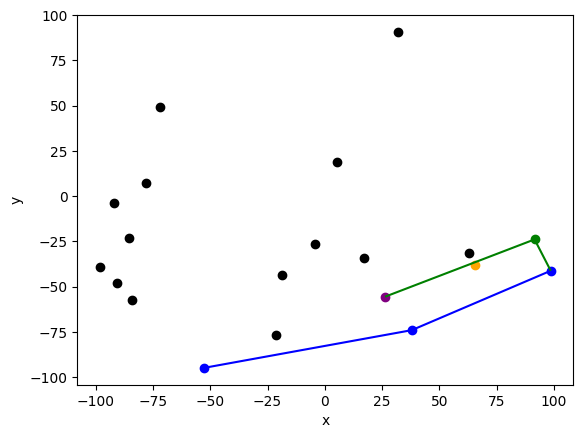

...

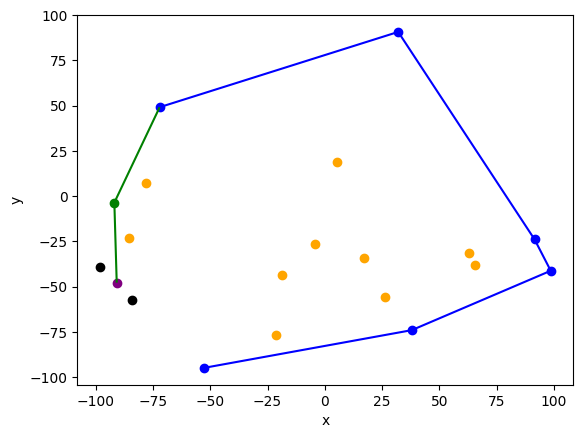

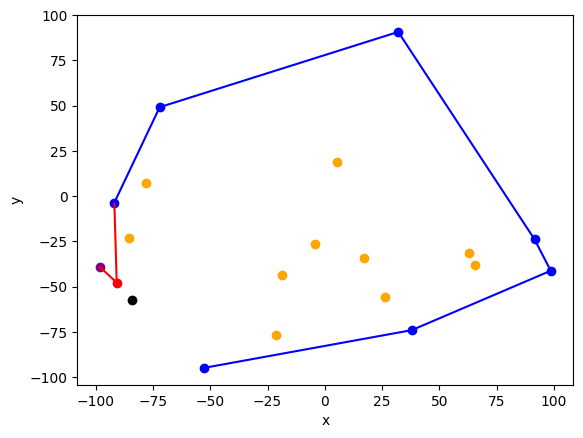

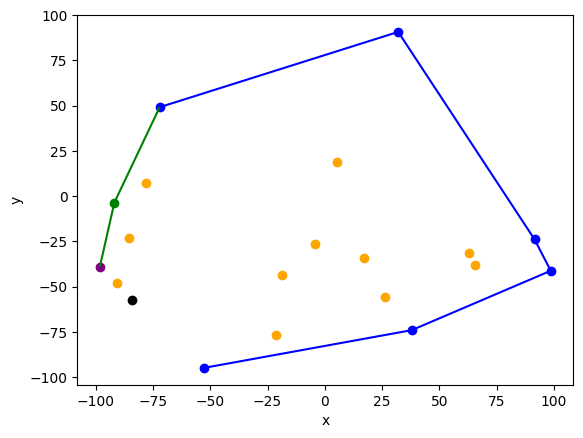

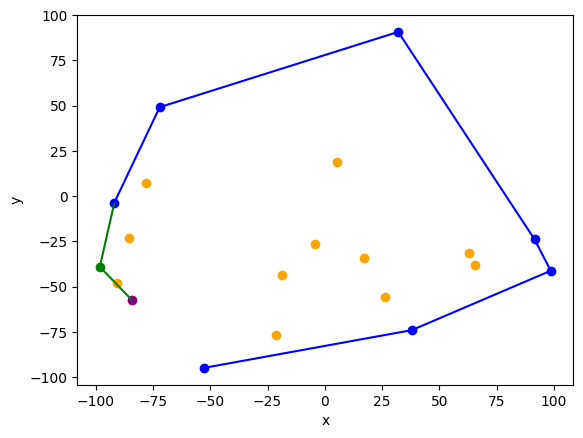

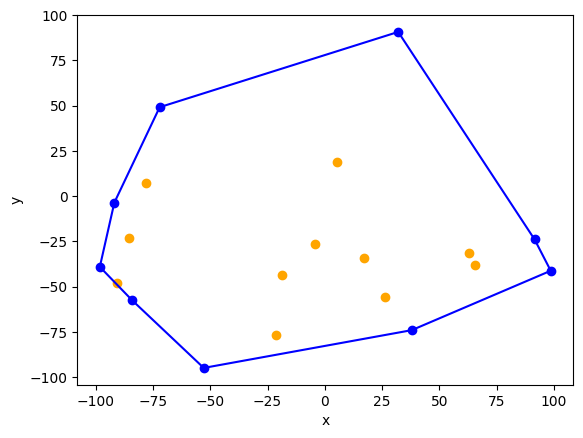

In [97]:
Q=points_a[:20]
start,start_idx=Start_point(Q)
Q,eliminated=Sort_points(Q,start,start_idx)
Draw_convex_hull(Q,eliminated)


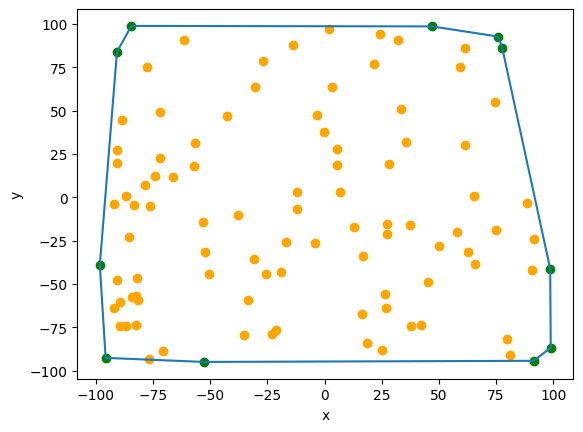

In [98]:
# visualize(graham_points_a)
vis.clear()
graham_points_a=graham_points_a_hull_100.copy()
vis.add_point(graham_points_a_hull_not_100, color=['orange'])
vis.add_point(graham_points_a_hull_100, color=['green'])
vis.add_line_segment([(graham_points_a[i], graham_points_a[i+1]) for i in range(len(graham_points_a)-1)])
vis.add_line_segment([graham_points_a[-1], graham_points_a[0]])
vis.show()

Zbiór danych B

In [99]:
graham_points_b_hull_100, graham_points_b_hull_not_100 = graham_algorithm(points_b,True)

In [100]:
graham_points_b_20 = generate_circle_points((0, 0), 10, 20)

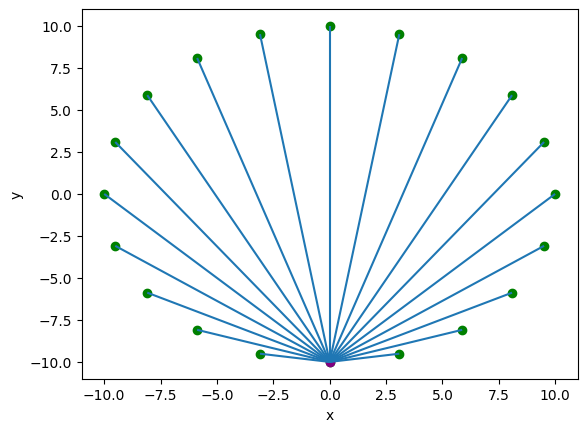

In [101]:
graham_algorithm_draw(graham_points_b_20)

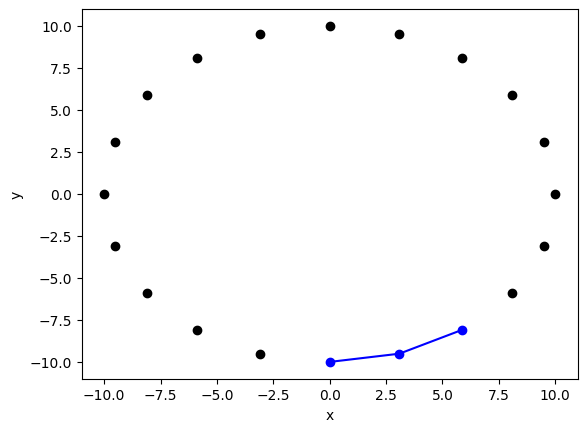

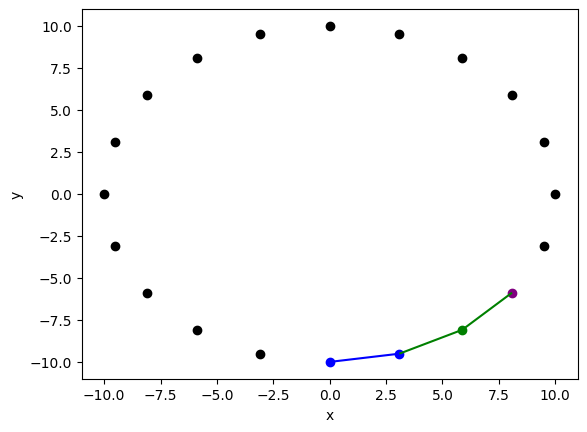

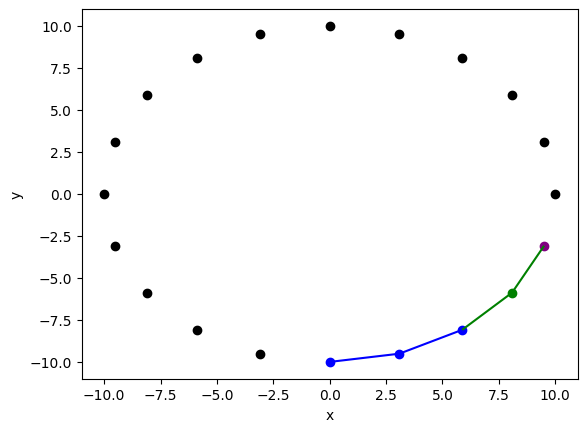

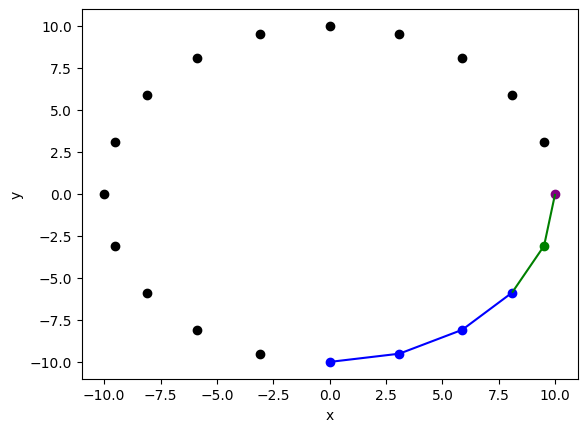

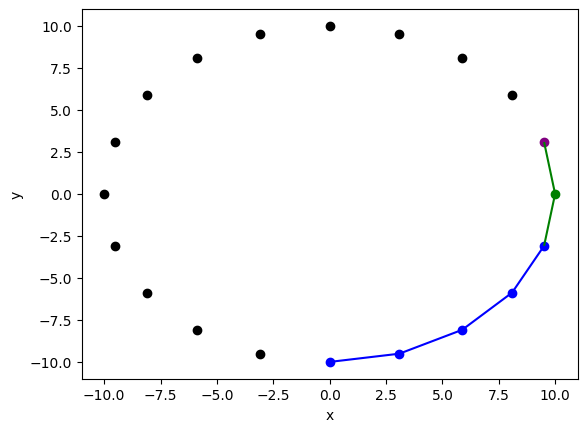

...

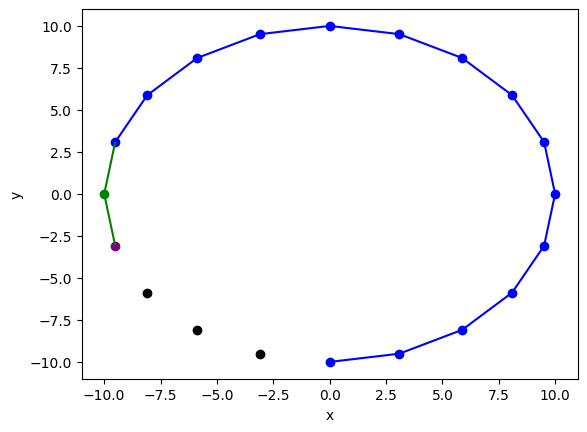

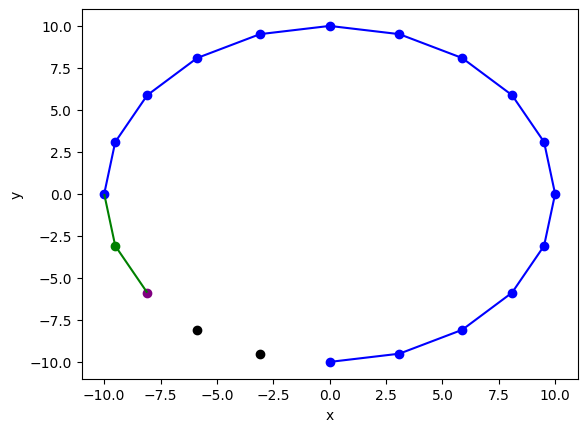

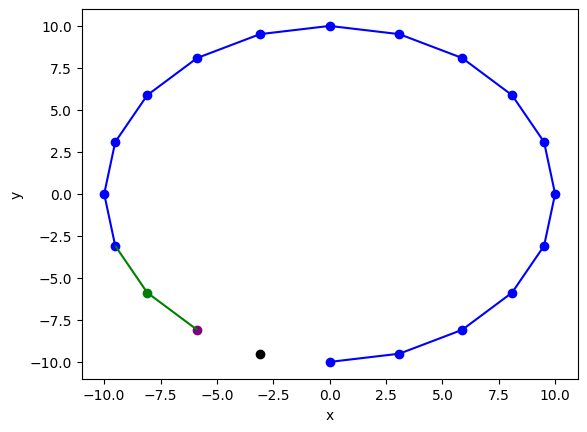

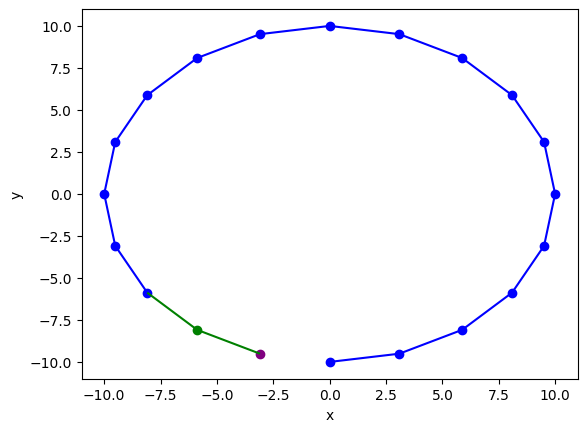

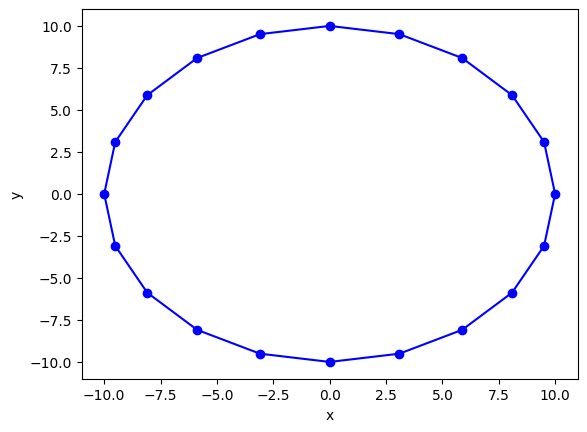

In [102]:
Q=copy.deepcopy(graham_points_b_20)
start,start_idx=Start_point(Q)
Q,eliminated=Sort_points(Q,start,start_idx)
Draw_convex_hull(Q,eliminated)

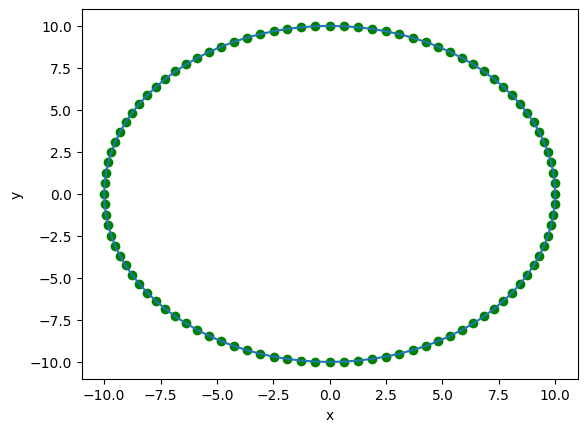

In [103]:
# visualize(graham_points_b)
vis.clear()
graham_points_b=graham_points_b_hull_100.copy()
vis.add_point(graham_points_b_hull_not_100, color=['orange'])
vis.add_point(graham_points_b_hull_100, color=['green'])
vis.add_line_segment([(graham_points_b[i], graham_points_b[i+1]) for i in range(len(graham_points_b)-1)])
vis.add_line_segment([graham_points_b[-1], graham_points_b[0]])
vis.show()

Zbiór danych C

In [104]:
graham_points_c_hull_100, graham_points_c_hull_not_100 = graham_algorithm(points_c,True)

In [105]:
graham_points_c_20 = generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=20) 

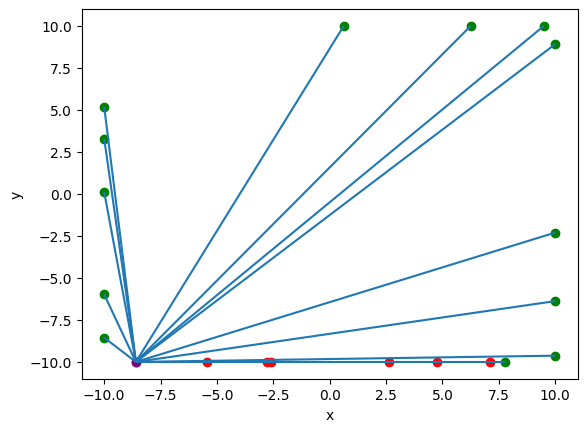

In [106]:
graham_algorithm_draw(graham_points_c_20)

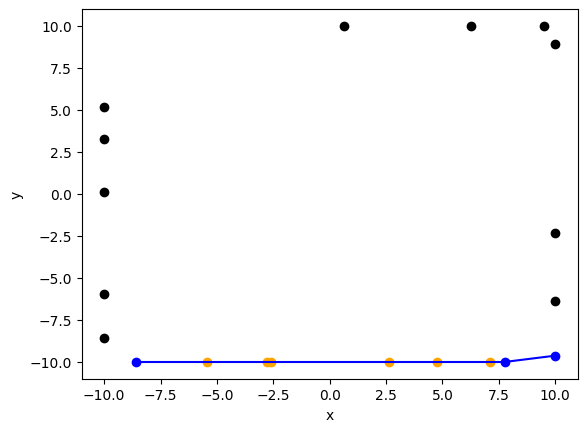

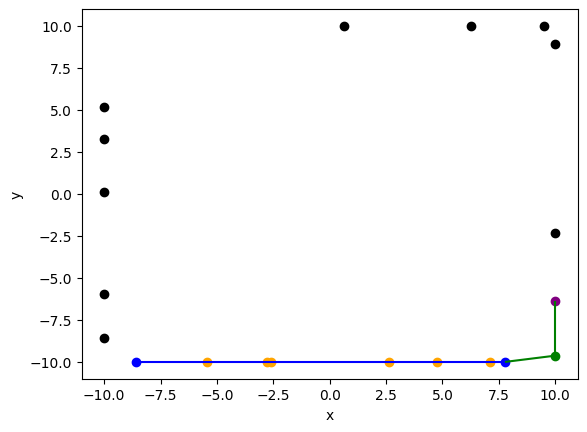

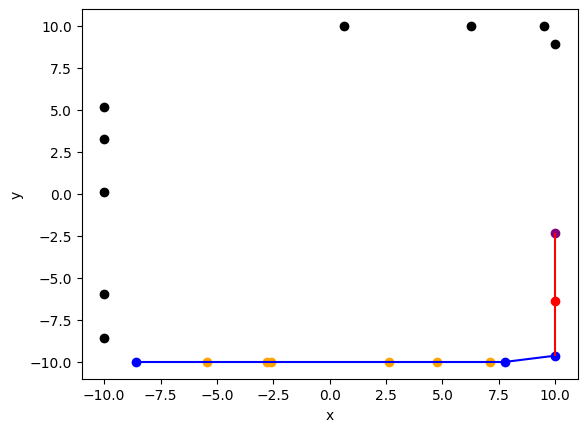

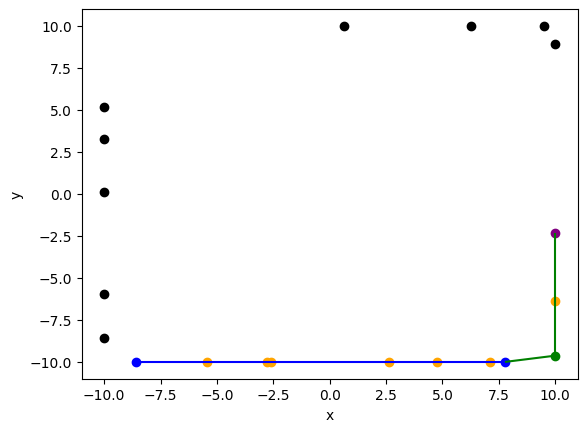

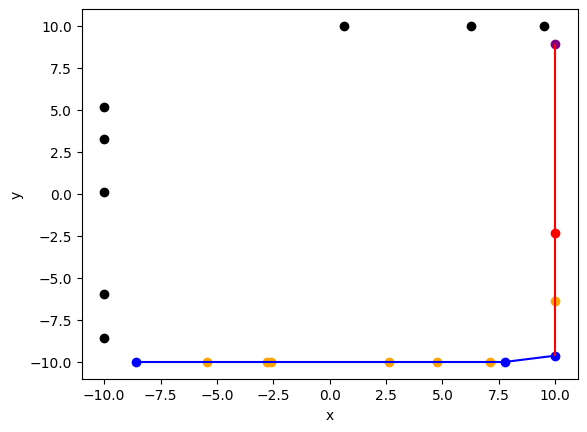

...

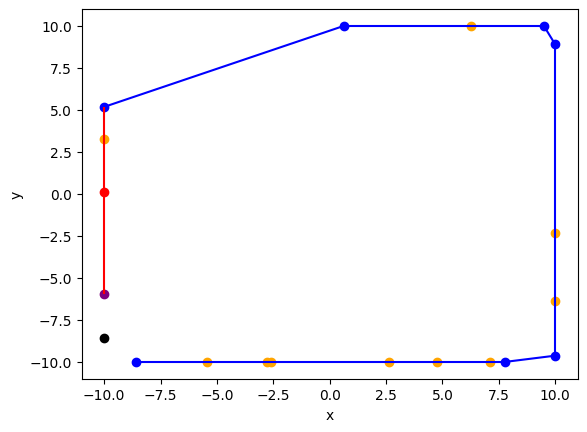

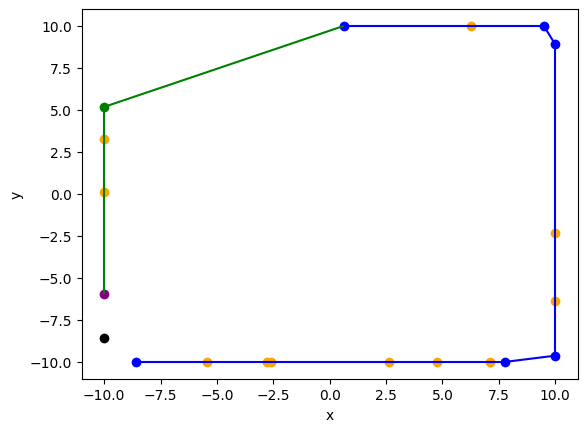

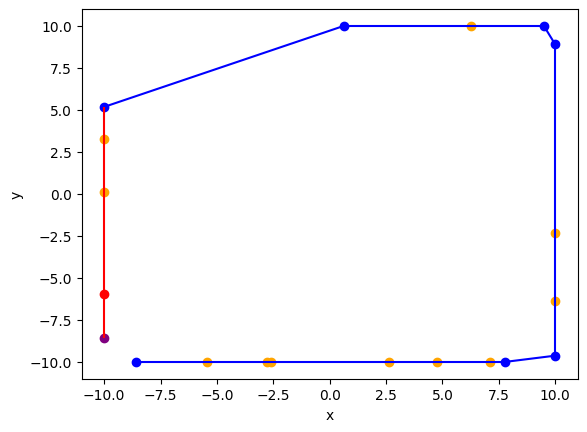

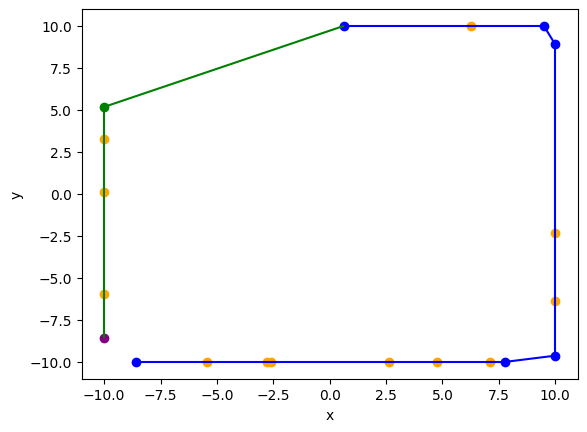

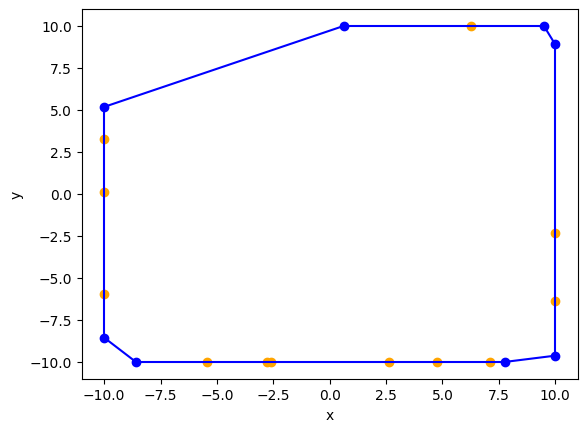

In [107]:
Q=copy.deepcopy(graham_points_c_20)
start,start_idx=Start_point(Q)
Q,eliminated=Sort_points(Q,start,start_idx)
Draw_convex_hull(Q,eliminated)

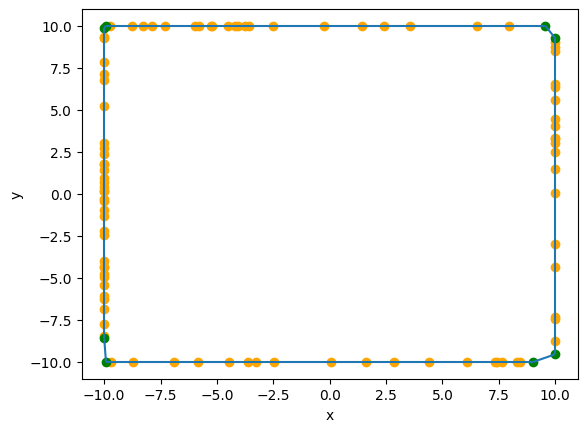

In [108]:
# visualize(graham_points_c)
vis.clear()
graham_points_c=graham_points_c_hull_100.copy()
vis.add_point(graham_points_c_hull_not_100, color=['orange'])
vis.add_point(graham_points_c_hull_100, color=['green'])
vis.add_line_segment([(graham_points_c[i], graham_points_c[i+1]) for i in range(len(graham_points_c)-1)])
vis.add_line_segment([graham_points_c[-1], graham_points_c[0]])
vis.show()

Zbiór danych D

In [109]:
graham_points_d_hull_25_20, graham_points_d_hull_not_25_20 = graham_algorithm(points_d,True)

In [110]:
graham_points_d_15_10 = generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10), axis_n=15, diag_n=10)

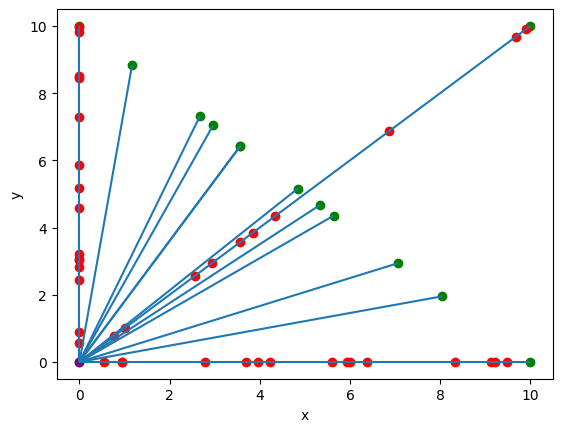

In [111]:
graham_algorithm_draw(graham_points_d_15_10)

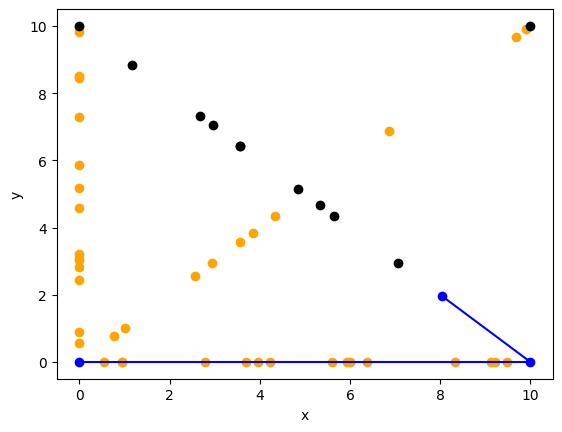

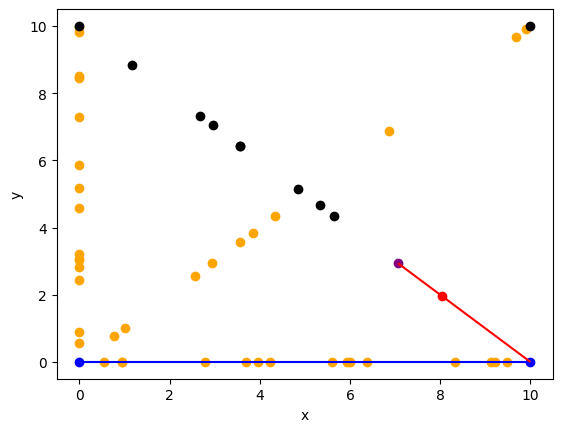

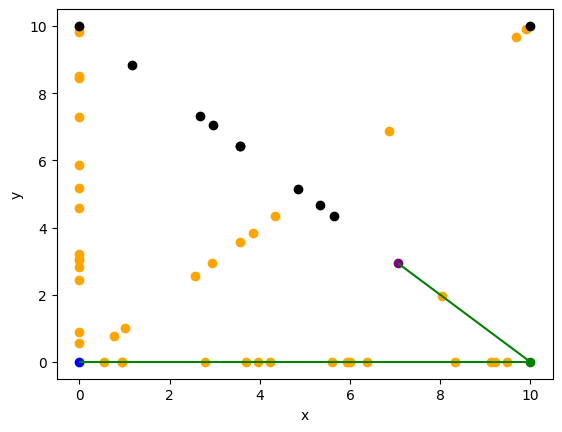

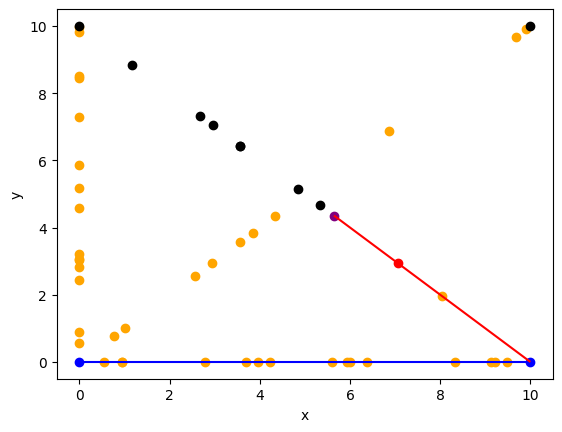

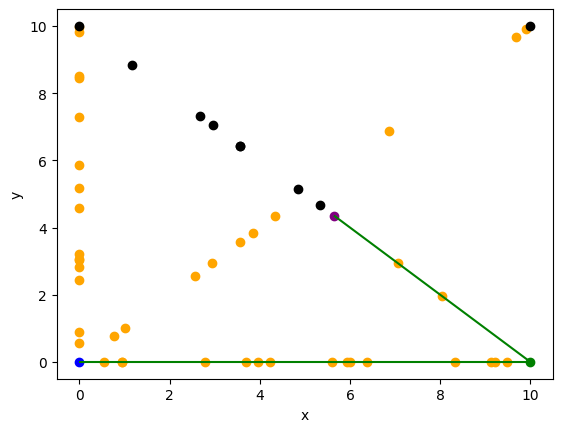

...

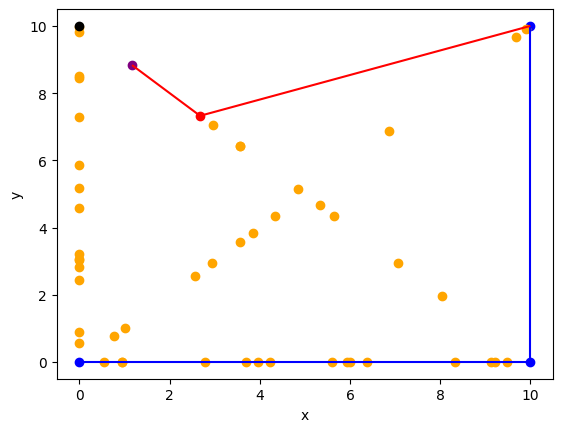

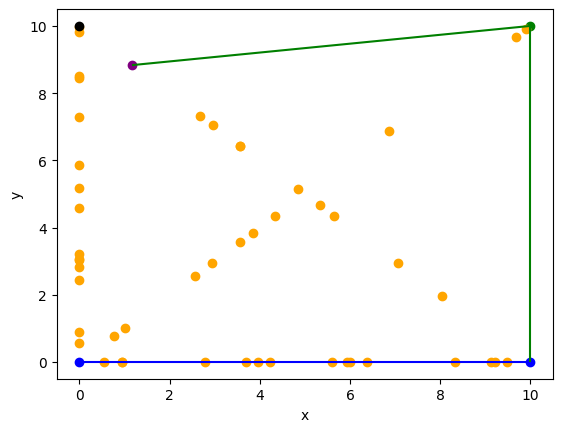

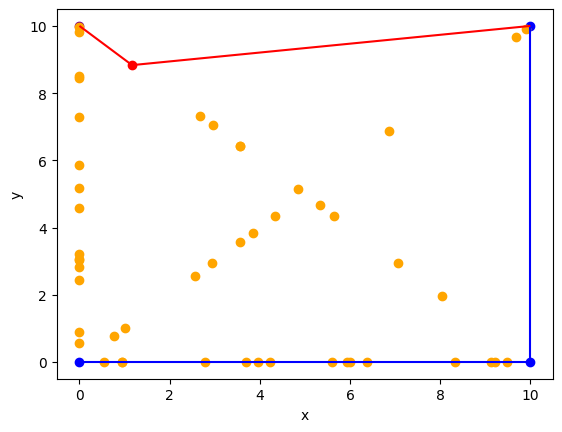

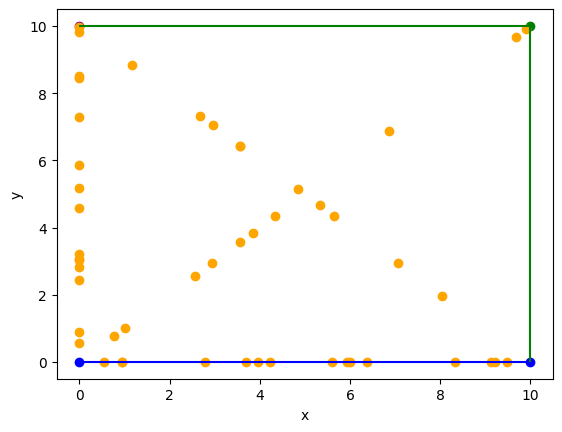

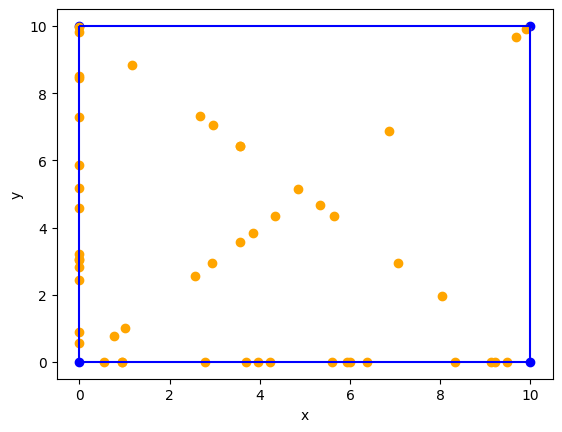

In [112]:
Q=copy.deepcopy(graham_points_d_15_10)
start,start_idx=Start_point(Q)
Q,eliminated=Sort_points(Q,start,start_idx)
Draw_convex_hull(Q,eliminated)

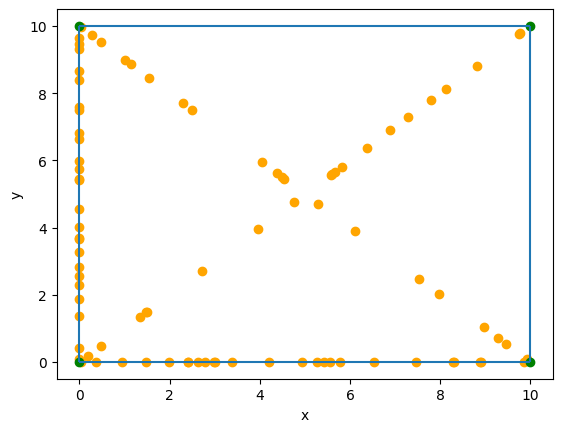

In [113]:
# visualize(graham_points_d)
vis.clear()
graham_points_d=graham_points_d_hull_25_20.copy()
vis.add_point(graham_points_d_hull_not_25_20, color=['orange'])
vis.add_point(graham_points_d_hull_25_20, color=['green'])
vis.add_line_segment([(graham_points_d[i], graham_points_d[i+1]) for i in range(len(graham_points_d)-1)])
vis.add_line_segment([graham_points_d[-1], graham_points_d[0]])
vis.show()

Algorytm Jarvisa oblicza otoczkę wypukłą dla zbioru punktów $Q$ przez technikę zwaną owijaniem paczki (*package wrapping*) lub owijaniem prezentu (*gift wrapping*). Algorytm Jarvisa buduje sekwencję $H = \langle p_1, p_2, \dots, p_m \rangle$ będącą wierzchołkami $\mathcal{CH}(Q)$. Zaczynamy od punktu $p_0$, następny punkt $p_1$ w otoczce wypukłej ma najmniejszy kąt w odniesieniu do $p_0$ (w przypadku takiego samego kąta - wybiera się punkt najdalej od $p_0$). Podobnie, gdy $p_2$ ma najmniejszy kąt w odniesieniu do $p_1$, itd.. Zauważyć warto, że możemy tym sposobem obliczyć lewy i prawy łańcuch otoczki wypukłej $\mathcal{CH}(Q)$. Lewy łańcuch buduje się podobnie. Gdy osiągniemy najwyższy wierzchołej w prawym łańcuchu $p_k$, wybieramy wierzchołek $p_{k+1}$, który ma najmniejszy kąt w odniesieniu do $p_k$, ale od ujemnej osi-$x$. Można zaimplementować algorytm Jarvisa bez konstruowania pomocniczych łańcuchów - lewego i prawego. Taka implementacja utrzymuje śledzenie kąta ostatniej strony otoczki wypukłej i wymaga sekwencji kątów boków otoczki tylko rosnącej. (Patrząc na trzy ostatnie punkty jesteśmy w stanie obliczyć jaki punkt należy włączyć do $\mathcal{CH}(Q)$ w zależności od budowanego punktu)

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa.

In [3]:
def Start_point (Q):
    # Jedynie dla lepszej wizualizacji
    start=Q[0]
    start_idx=0
    for i in range (1,len(Q)):
        if Q[i][1]<start[1]:
            start=Q[i]
            start_idx=i
        elif Q[i][1]==start[1]:
            if Q[i][0]<start[0]:
                start=Q[i]
                start_idx=i
    return start,start_idx


def orient (a,b,c):
    # Występuje tu zamiana typu danych na dokładność do 64 liczb miejsc po przecinku
    eps=eps=1e-30
    new_a=(decimal.Decimal(a[0]),decimal.Decimal(a[1]))
    new_b=(decimal.Decimal(b[0]),decimal.Decimal(b[1]))
    new_c=(decimal.Decimal(c[0]),decimal.Decimal(c[1]))
    det=(new_b[0]-new_a[0])*(new_c[1]-new_b[1])-(new_b[1]-new_a[1])*(new_c[0]-new_b[0])
    if abs(det)<eps:
        return 0
    elif det>0:
        return 1
    else:
        return -1


def further (a,b,c):
    if a[0]==b[0]:
        if abs(a[1]-b[1])>abs(a[1]-c[1]):
            return True
        else:
            return False
    else:
        if abs(a[0]-b[0])>abs(a[0]-c[0]):
            return True
        else:
            return False



def jarvis_algorithm(Q,all_points=False):
    if len(Q)==1:
        if all_points==True:
            return Q, []
        else:
            return Q
    last,last_idx=Start_point(Q)
    hull=[]
    is_on_hull=[False for _ in range (len(Q))]
    not_hull=[]
    if len(Q)==2:
        hull.append(last)
        hull.append(Q[abs(last_idx-1)])
        if all_points==True:
            return hull, not_hull
    else:
        while True:
            hull.append(last)
            is_on_hull[last_idx]=True
            if last_idx==0:
                next_point=Q[1]
                next_point_idx=1
            else:
                next_point=Q[0]
                next_point_idx=0
            for i in range (len(Q)):
                if i!=last_idx and i!=next_point_idx:
                    orientation=orient(last,next_point,Q[i])
                    if orientation<0 or (orientation==0 and further(last,next_point,Q[i])==False):
                        next_point=Q[i]
                        next_point_idx=i
            last=next_point
            last_idx=next_point_idx
            if last==hull[0]:
                break
    for i in range (len(Q)):
        if is_on_hull[i]==False:
            not_hull.append(Q[i])
    if all_points==True:
        return hull, not_hull
    else:
        return hull
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    raise Exception("Unimplemented")

Przetestuj swoją implementacje algorytmu Jarvisa, by sprawdzić czy poprawnie obliczana jest otoczka.

In [4]:
Test().runtest(2, jarvis_algorithm)

Lab 2, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 53.125s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa z dodatkową opcją wyświetlania kroków algorytmu.

In [116]:



def Vis_hull_jarvis(hull,Q,eliminated,first_idx,next_point_idx,check_point_idx,is_good=False,start=False,last=False):
    vis.add_point([Q[i] for i in range (len(Q))], color=['black'])
    vis.clear()
    if last==True:
        vis.add_line_segment([(hull[i], hull[i+1]) for i in range(len(hull)-1)], color=['blue'])
        vis.add_line_segment([(hull[len(hull)-1], hull[0])], color=['blue'])
        vis.add_point(hull[1:], color=['blue'])
        vis.add_point([Q[first_idx]], color=['purple'])
    elif start==False:
        vis.add_point([Q[first_idx]], color=['purple'])
        vis.add_line_segment([(hull[i], hull[i+1]) for i in range(len(hull)-1)], color=['blue'])
        vis.add_point(hull, color=['blue'])
        if is_good==True:
            vis.add_line_segment([(hull[-1], Q[next_point_idx]),(Q[next_point_idx], Q[check_point_idx])] , color=['green'])
            vis.add_point([Q[next_point_idx]], color=['green'])
        else:
            vis.add_line_segment([(hull[-1], Q[next_point_idx]),(Q[next_point_idx], Q[check_point_idx])] , color=['red'])
            vis.add_point([Q[next_point_idx]], color=['red'])
        vis.add_point([Q[check_point_idx]], color=['pink'])
    else:
        vis.add_point([Q[first_idx]], color=['purple'])
    vis.add_point([Q[i] for i in range (0,check_point_idx) if (eliminated[i]==False)], color=['orange'])
    vis.add_point([Q[i] for i in range (check_point_idx,len(Q)) if (eliminated[i]==False)], color=['black'])
    vis.show()


def jarvis_algorithm_draw(Q):
    vis.clear()
    if len(Q)==1:
        vis.add_point(Q, color=['blue'])
        vis.show()
    if len(Q)>1:
        last,last_idx=Start_point(Q)
        first_idx=last_idx
        hull=[]
    if len(Q)==2:
        hull.append(last)
        hull.append(Q[abs(last_idx-1)])
        vis.add_point(hull, color=['blue'])
        vis.add_line_segment((hull[0], hull[1]), color=['blue'])
        vis.show()
    if len(Q)>2:
        eliminated=[False for _ in range (len(Q))]
        eliminated[last_idx]=True
        is_on_hull=[False for _ in range (len(Q))]
        eliminated[last_idx]=True
        Vis_hull_jarvis(hull,Q,eliminated,first_idx,0,0,start=True)
        while True:
            hull.append(last)
            is_on_hull[last_idx]=True
            if last_idx==0:
                next_point=Q[1]
                next_point_idx=1
            else:
                next_point=Q[0]
                next_point_idx=0
            eliminated[next_point_idx]=True
            for i in range (len(Q)):
                if i!=last_idx and i!=next_point_idx:
                    orientation=orient(last,next_point,Q[i])
                    eliminated[i]=True
                    if orientation<0 or (orientation==0 and further(last,next_point,Q[i])==False):
                        Vis_hull_jarvis(hull,Q,eliminated,first_idx,next_point_idx,i,is_good=False)
                        if is_on_hull[next_point_idx]==False:
                            eliminated[next_point_idx]=False
                        next_point=Q[i]
                        next_point_idx=i
                    else:
                        Vis_hull_jarvis(hull,Q,eliminated,first_idx,next_point_idx,i,is_good=True)
                        if is_on_hull[i]==False:
                            eliminated[i]=False
            last=next_point
            last_idx=next_point_idx
            if last==hull[0]:
                break
        Vis_hull_jarvis(hull,Q,eliminated,first_idx,len(Q),0,last=True)

    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa oraz 
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci  (tablica punktów w postaci krotek współrzędnych,
                                wizualizer pokazujący kroki algorytmu) 
    '''


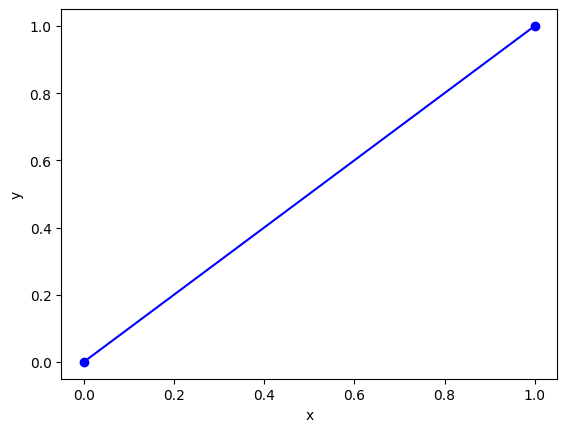

In [117]:
a_few_points=[(1,1),(0,0)]
jarvis_algorithm_draw(a_few_points)

Zwizualizuj swoją implementację algorytmu.

Zbiór danych A

In [118]:
jarvis_points_a_hull_100,jarvis_points_a_hull_not_100 = jarvis_algorithm(points_a,all_points=True)

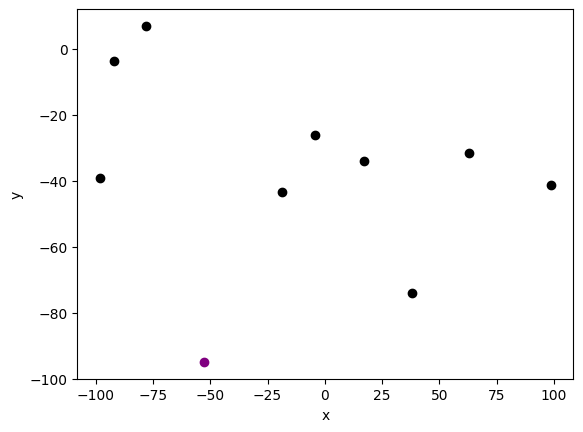

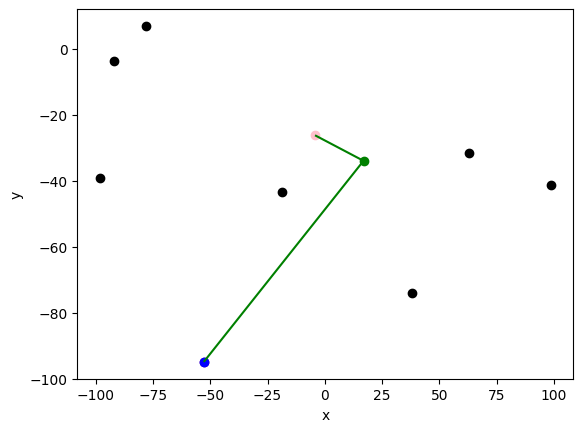

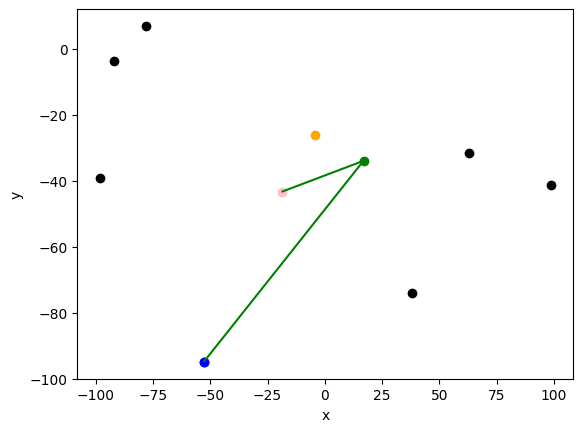

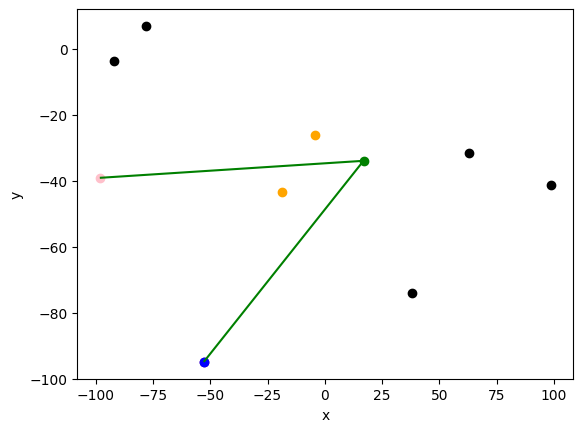

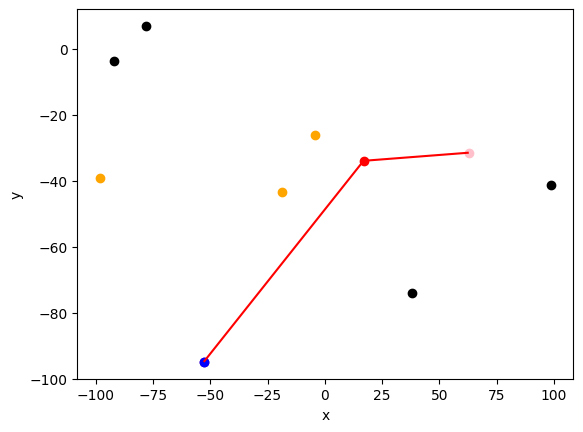

...

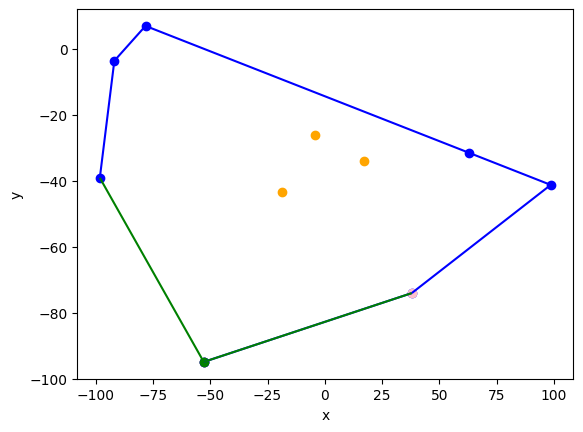

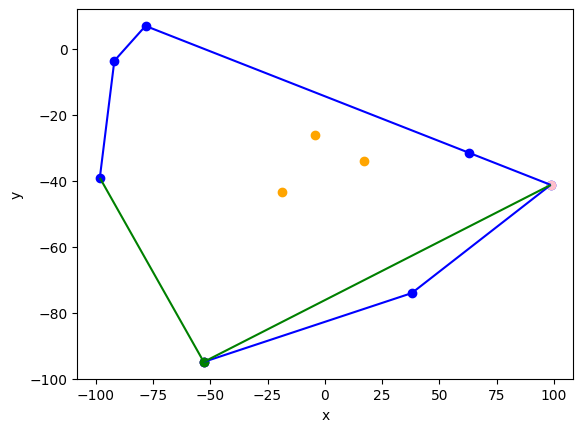

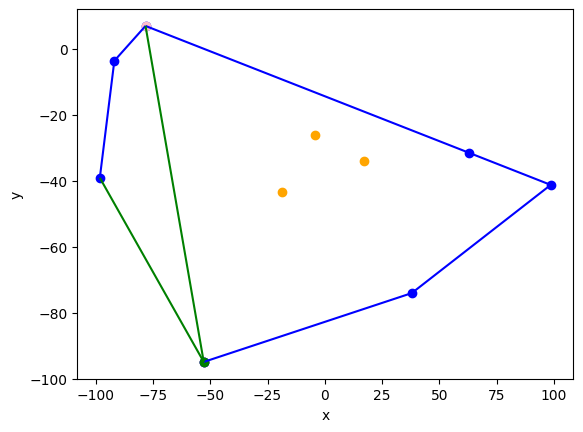

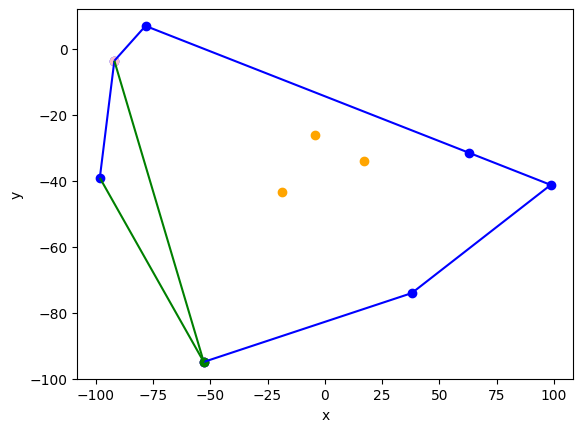

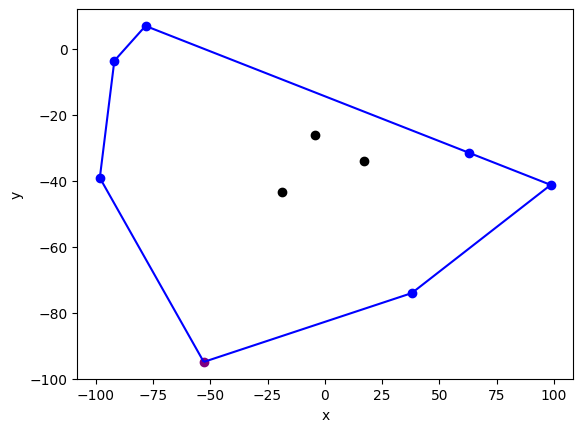

In [119]:
jarvis_algorithm_draw(points_a[:10])

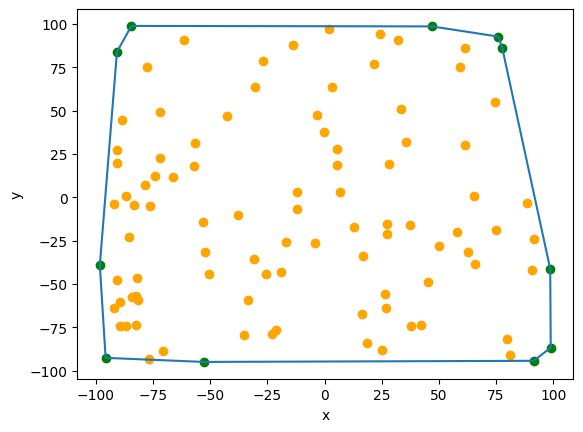

In [120]:
# visualize(jarvis_points_a)
vis.clear()
jarvis_points_a=jarvis_points_a_hull_100.copy()
vis.add_point(jarvis_points_a_hull_100, color=['green'])
vis.add_point(jarvis_points_a_hull_not_100, color=['orange'])
vis.add_line_segment([(jarvis_points_a[i], jarvis_points_a[i+1]) for i in range(len(jarvis_points_a)-1)])
vis.add_line_segment([jarvis_points_a[-1], jarvis_points_a[0]])
vis.show()

Zbiór danych B

In [121]:
jarvis_points_b_hull_100,jarvis_points_b_hull_not_100 = jarvis_algorithm(points_b,all_points=True)

In [122]:
jarvis_points_b_10 = generate_circle_points((0, 0), 10, 10)

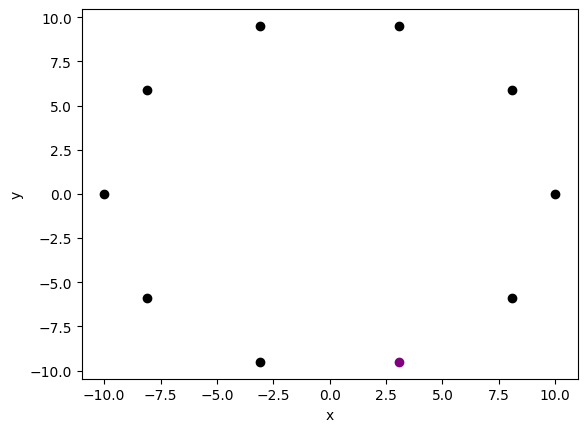

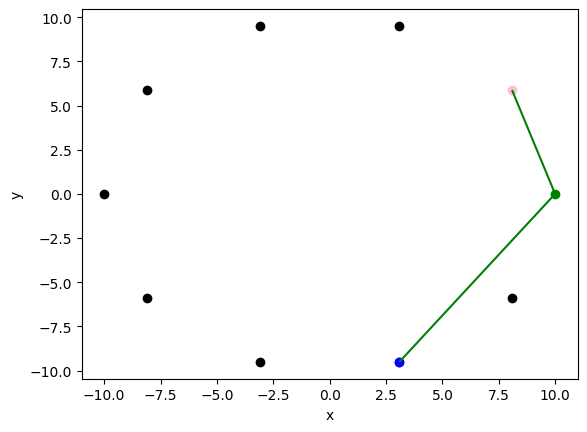

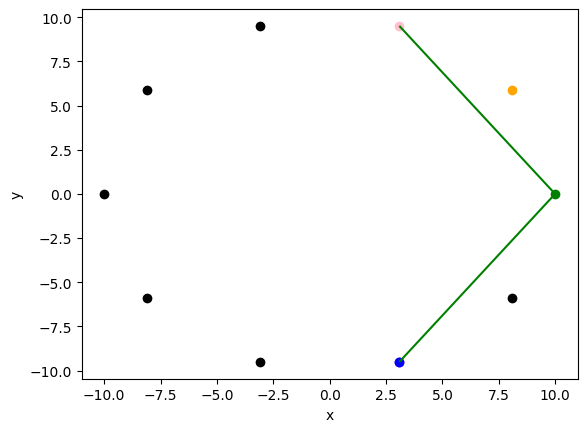

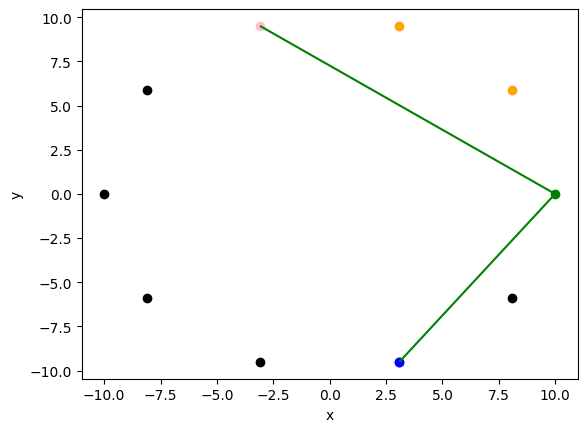

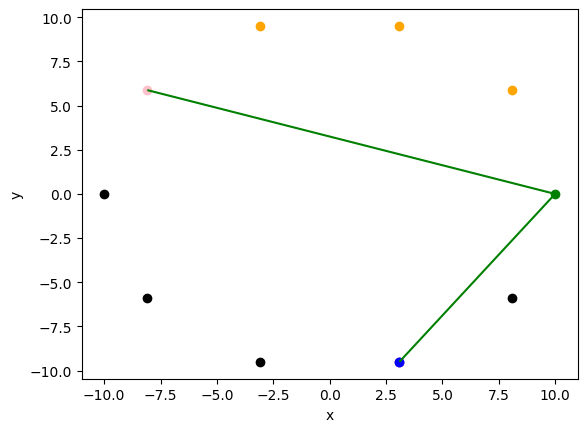

...

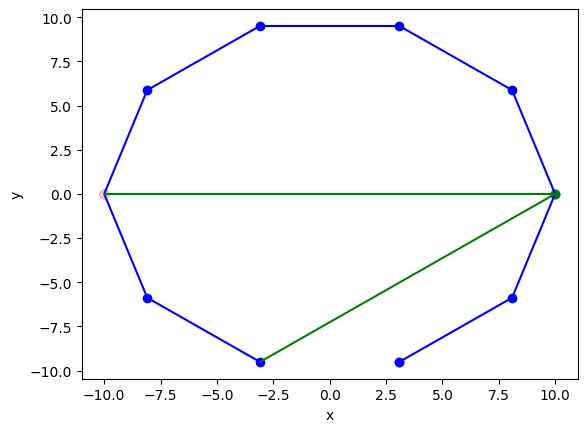

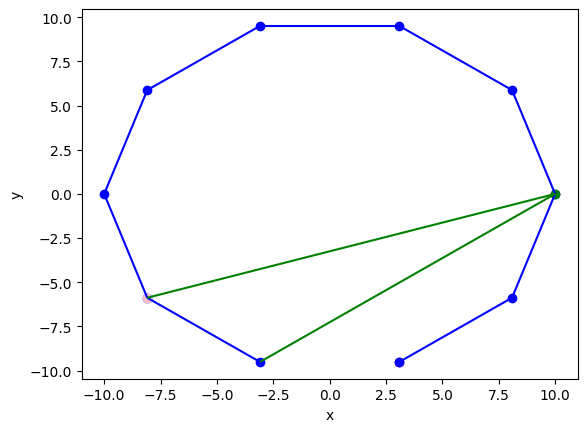

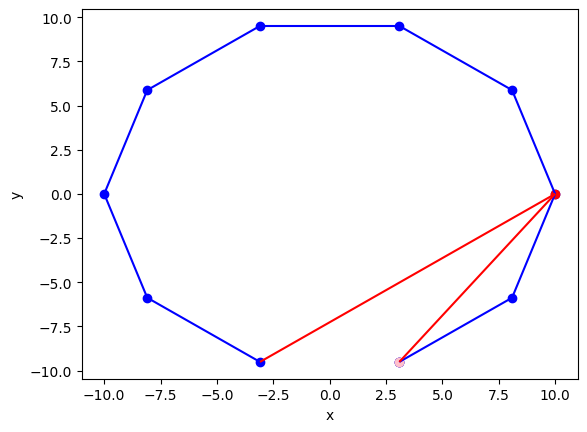

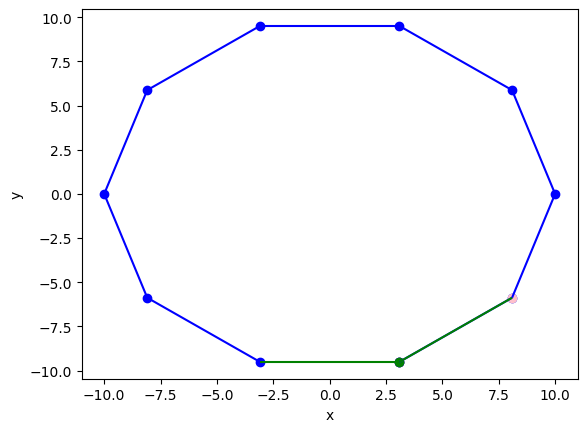

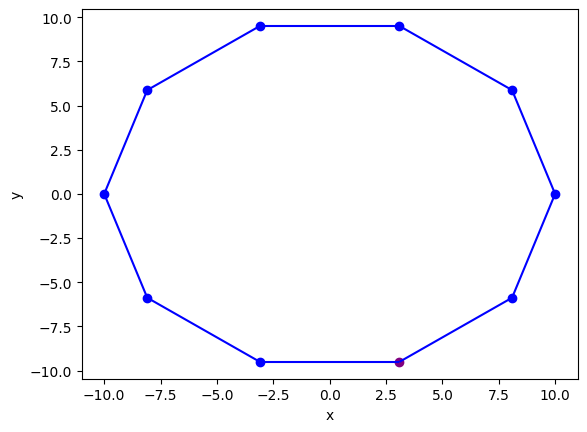

In [123]:
jarvis_algorithm_draw(jarvis_points_b_10)

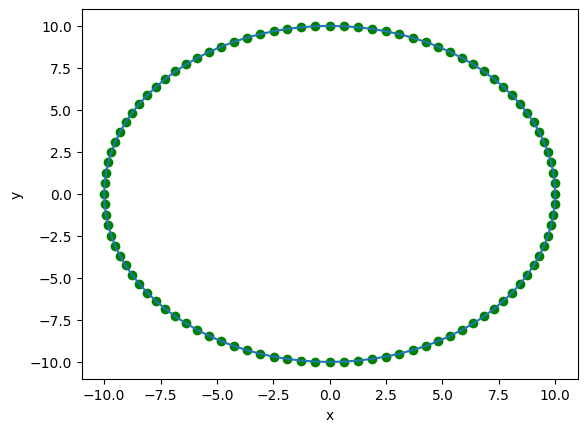

In [124]:
# visualize(jarvis_points_b)
vis.clear()
jarvis_points_b=jarvis_points_b_hull_100.copy()
vis.add_point(jarvis_points_b_hull_100, color=['green'])
vis.add_point(jarvis_points_b_hull_not_100, color=['orange'])
vis.add_line_segment([(jarvis_points_b[i], jarvis_points_b[i+1]) for i in range(len(jarvis_points_b)-1)])
vis.add_line_segment([jarvis_points_b[-1], jarvis_points_b[0]])
vis.show()

Zbiór danych C

In [125]:
jarvis_points_c_hull_100,jarvis_points_c_hull_not_100 = jarvis_algorithm(points_c,all_points=True)

In [126]:
jarvis_points_c_10 = generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=10) 

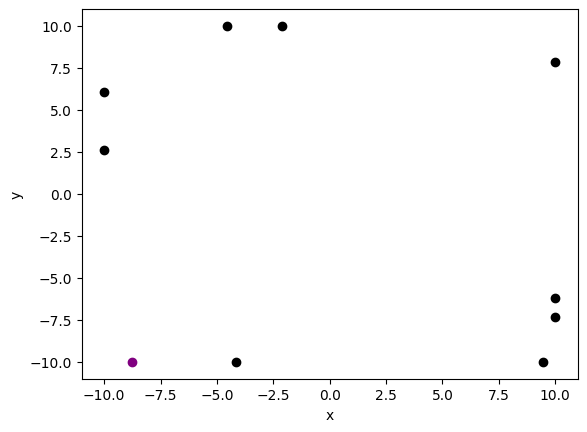

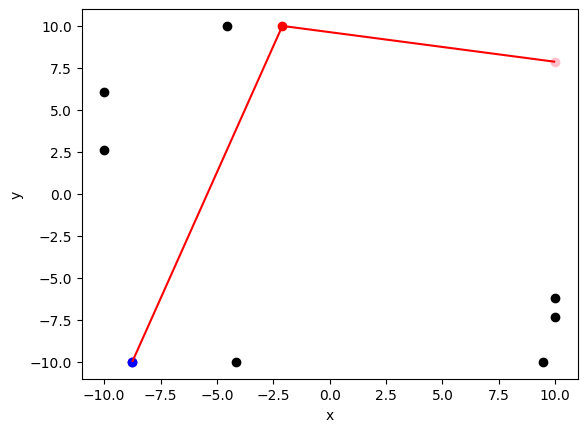

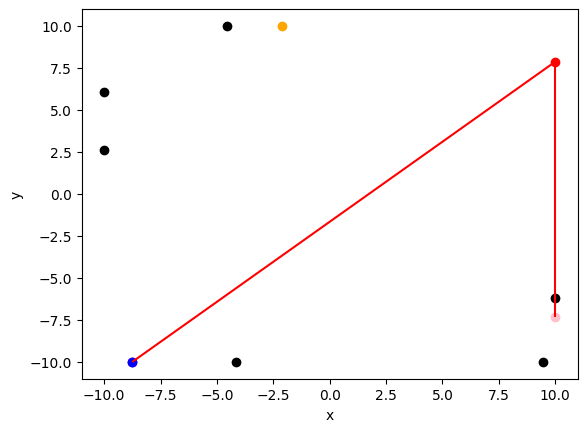

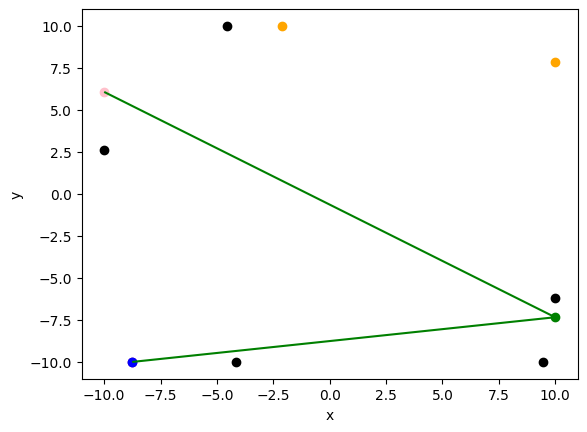

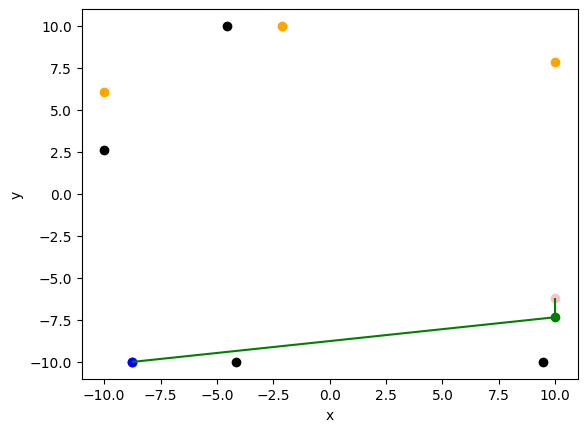

...

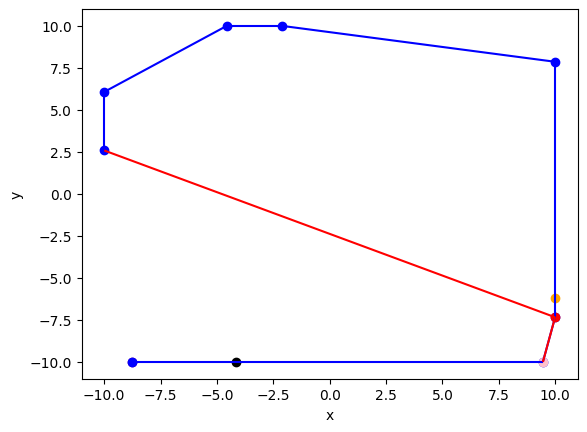

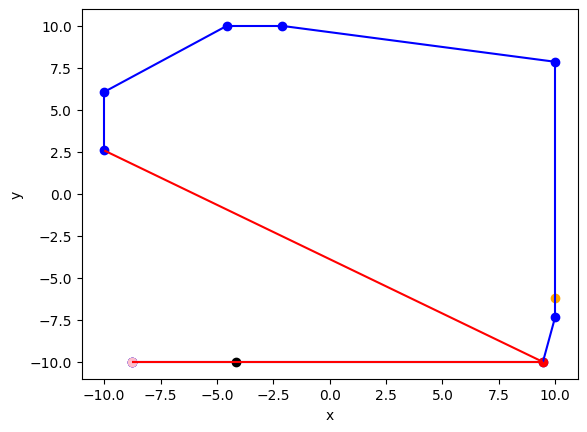

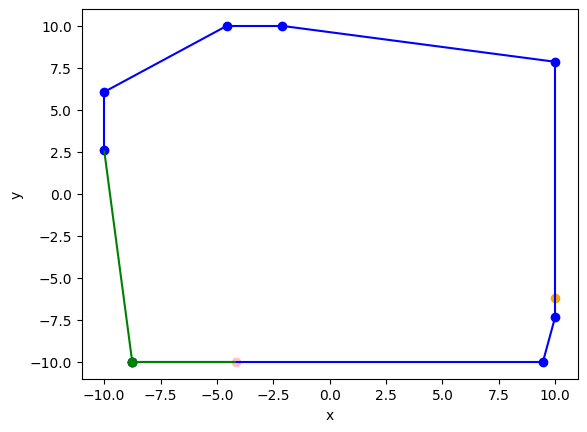

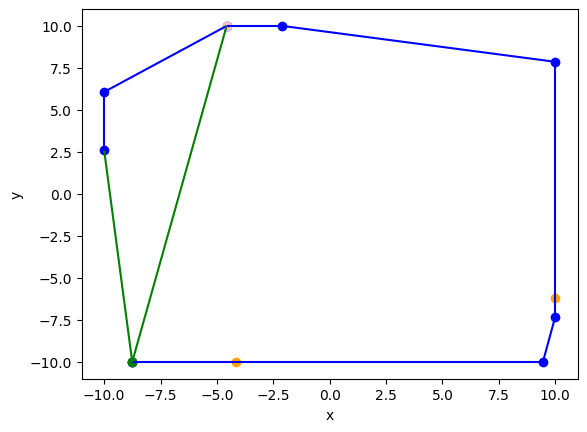

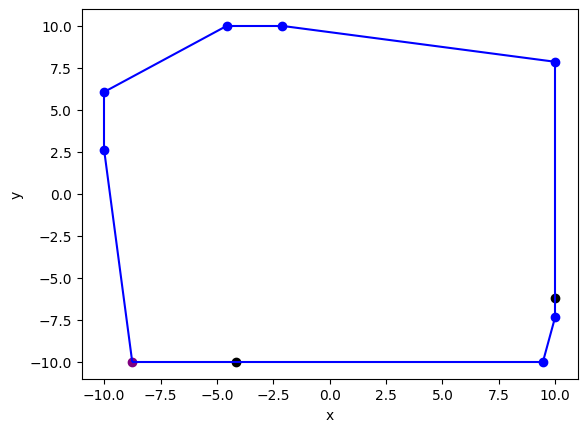

In [127]:
jarvis_algorithm_draw(jarvis_points_c_10)

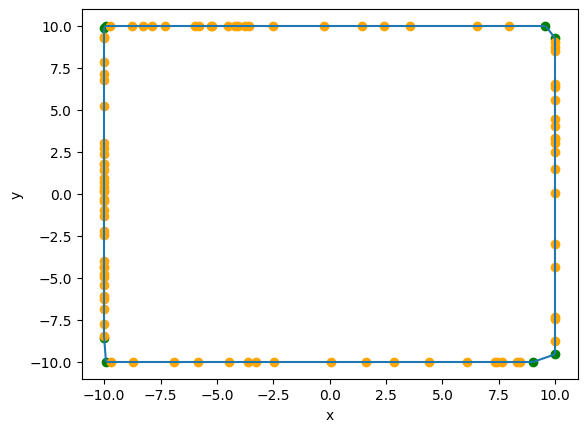

In [128]:
# visualize(jarvis_points_c)
vis.clear()
jarvis_points_c=jarvis_points_c_hull_100.copy()
vis.add_point(jarvis_points_c_hull_100, color=['green'])
vis.add_point(jarvis_points_c_hull_not_100, color=['orange'])
vis.add_line_segment([(jarvis_points_c[i], jarvis_points_c[i+1]) for i in range(len(jarvis_points_c)-1)])
vis.add_line_segment([jarvis_points_c[-1], jarvis_points_c[0]])
vis.show()

Zbiór danych D

In [129]:
jarvis_points_d_hull_25_20,jarvis_points_d_hull_not_25_20 = jarvis_algorithm(points_d,all_points=True)

In [130]:
jarvis_points_d_3_2 = generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10), axis_n=3, diag_n=2)

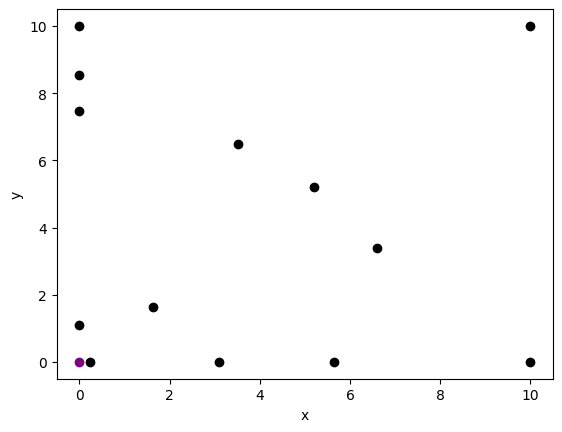

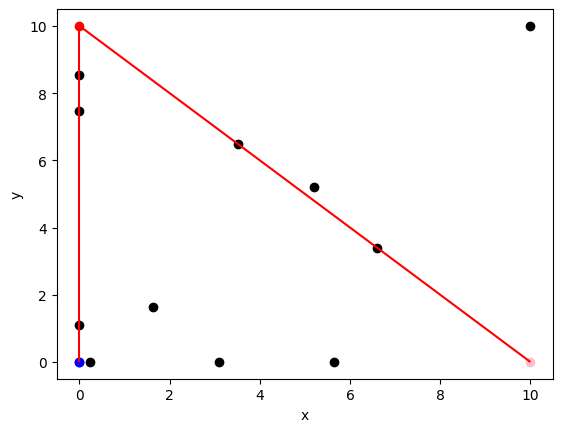

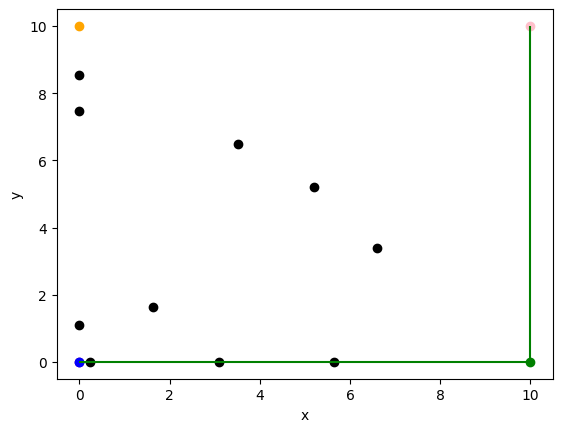

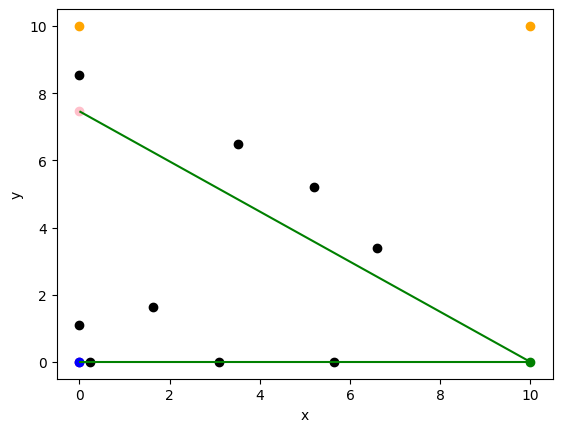

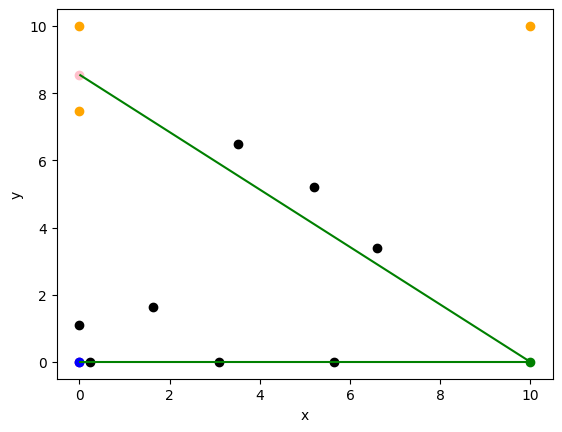

...

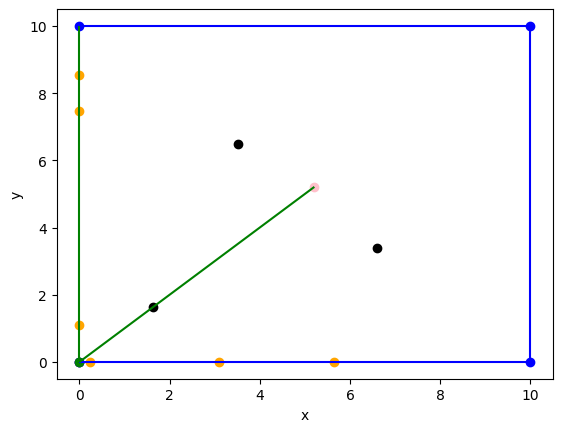

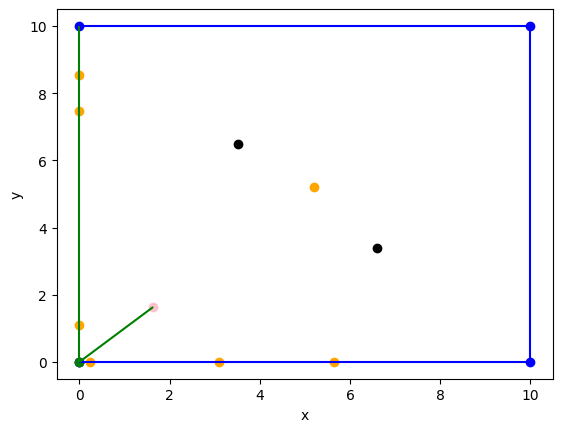

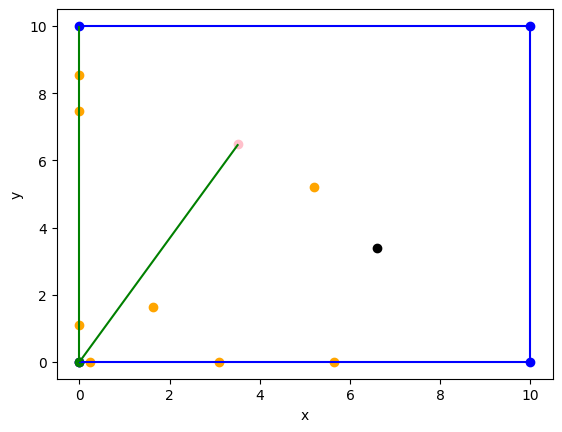

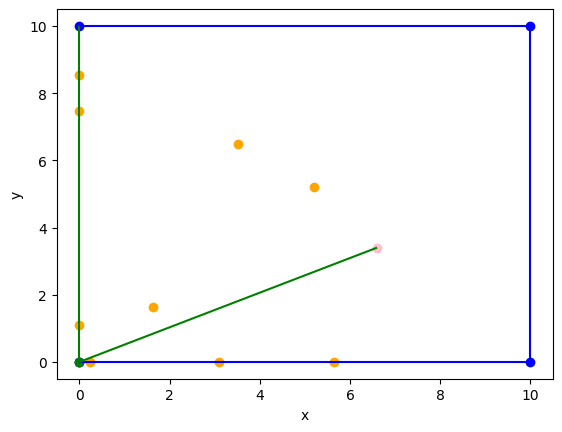

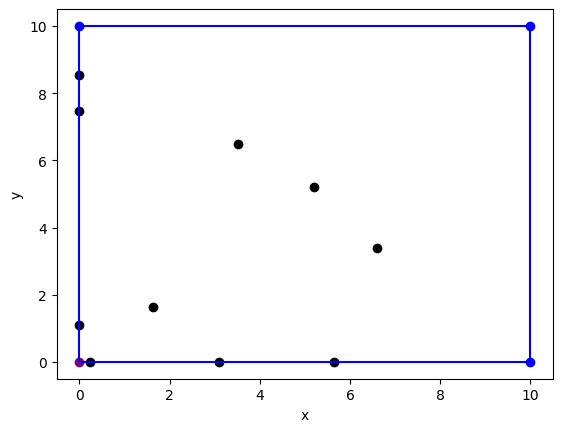

In [131]:
jarvis_algorithm_draw(jarvis_points_d_3_2)

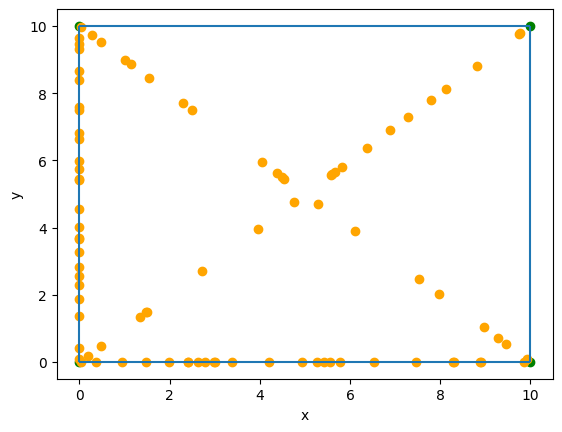

In [132]:
# visualize(jarvis_points_d)
vis.clear()
jarvis_points_d=jarvis_points_d_hull_25_20.copy()
vis.add_point(jarvis_points_d_hull_25_20, color=['green'])
vis.add_point(jarvis_points_d_hull_not_25_20, color=['orange'])
vis.add_line_segment([(jarvis_points_d[i], jarvis_points_d[i+1]) for i in range(len(jarvis_points_d)-1)])
vis.add_line_segment([jarvis_points_d[-1], jarvis_points_d[0]])
vis.show()


---

Po zobaczeniu i przetestowaniu wstępnie zbiorów danych, przyszła kolej na porównanie czasów działania dla różnych danych. Do tego potrzebujemy bardziej miarodajnych zbiorów danych.  
<span style="color:red">Ćw.</span> Stwórz zmodyfikowane zbiory danych A, B, C oraz D - tak jak uważasz za słuszne.

In [133]:
# prepare your data to time-test

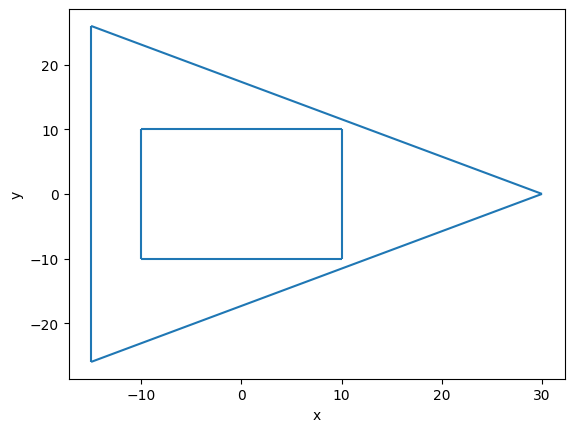

In [134]:
vis.clear()
a=[(-10,-10),(-10,10),(10,10),(10,-10)]
b=generate_circle_points((0, 0), 30, 3)
vis.add_line_segment([(a[i], a[i+1]) for i in range(len(a)-1)])
vis.add_line_segment([a[-1], a[0]])
vis.add_line_segment([(b[i], b[i+1]) for i in range(len(b)-1)])
vis.add_line_segment([b[-1], b[0]])
vis.show()

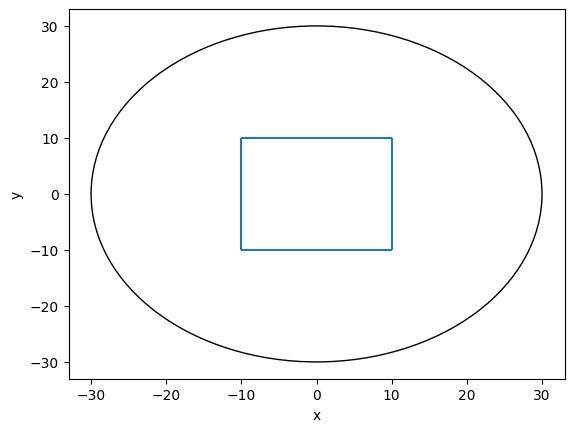

In [135]:
vis.clear()
a=[(-10,-10),(-10,10),(10,10),(10,-10)]
vis.add_line_segment([(a[i], a[i+1]) for i in range(len(a)-1)])
vis.add_line_segment([a[-1], a[0]])
vis.add_circle((0,0,30), fill=False)
vis.show()

In [136]:
def CreatePoints(p,k):
    new_points=generate_uniform_points(-10, 10, p)
    new_points.extend(generate_circle_points((0, 0), 30, k))
    new_points=random.sample(new_points,len(new_points))
    return new_points

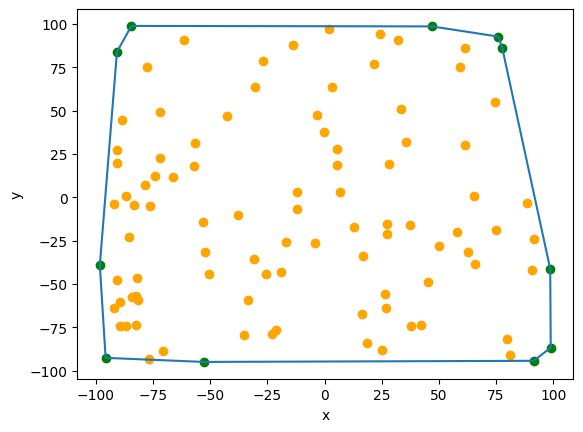

In [137]:
vis.clear()
new_points=CreatePoints(100,900)
jarvis_points_a=jarvis_points_a_hull_100.copy()
vis.add_point(jarvis_points_a_hull_100, color=['green'])
vis.add_point(jarvis_points_a_hull_not_100, color=['orange'])
vis.add_line_segment([(jarvis_points_a[i], jarvis_points_a[i+1]) for i in range(len(jarvis_points_a)-1)])
vis.add_line_segment([jarvis_points_a[-1], jarvis_points_a[0]])
vis.show()

Po przygotowaniu zbioru danych, dokonaj porównania czasowego  
<span style="color:red">Ćw.</span> Porównaj zmodyfikowane zbiory danych A, B, C oraz D dla algorytmów Grahama i Jarvisa.

In [138]:
# compare your sets of data 

In [139]:
def Show_the_result(on_hull,not_on_hull):
    vis.clear()
    vis.add_point(on_hull, color=['green'])
    vis.add_point(not_on_hull, color=['orange'])
    vis.add_line_segment([(on_hull[i], on_hull[i+1]) for i in range(len(on_hull)-1)])
    vis.add_line_segment([on_hull[-1], on_hull[0]])
    vis.show()

def Cmp_Graphs(new_points):
    using_graham_hull, using_graham_hull_not = graham_algorithm(new_points,all_points=True)
    using_jarvis_hull,using_jarvis_hull_not = jarvis_algorithm(new_points,all_points=True)
    Show_the_result(using_graham_hull, using_graham_hull_not)
    Show_the_result(using_jarvis_hull,using_jarvis_hull_not)


In [140]:
def GenerateResultGraham(new_points):
    start_time_graham = time.time()
    _ = graham_algorithm(new_points)
    end_time_graham = time.time()
    time_graham = end_time_graham - start_time_graham
    return time_graham

def GenerateResultJarvis(new_points):
    start_time_jarvis = time.time()
    _ = jarvis_algorithm(new_points)
    end_time_jarvis = time.time()
    time_jarvis = end_time_jarvis - start_time_jarvis
    return time_jarvis

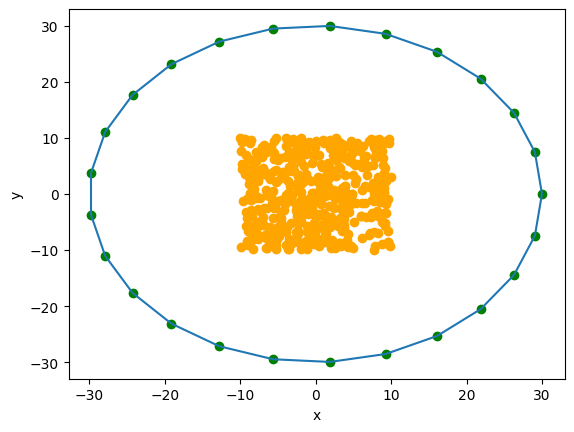

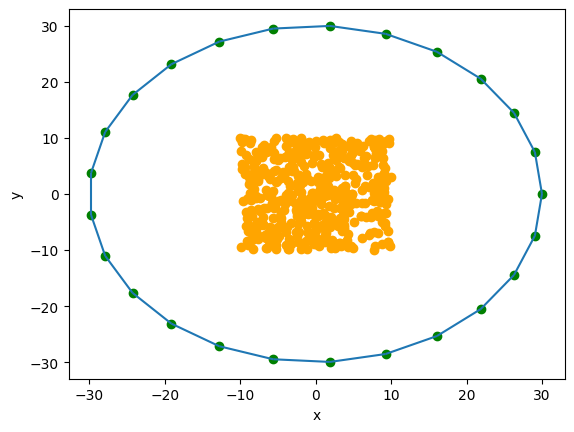

In [141]:
new_points=CreatePoints(475,25)
Cmp_Graphs(new_points)

In [142]:
time_data_a=[[0,0,0,0]for _ in range (10)]
time_data_b=[[0,0,0,0]for _ in range (10)]
time_data_c=[[0,0,0,0]for _ in range (10)]
time_name=[]
for i in range (10):
    n=(i+1)*200
    time_name.append(str(n)+" Punktów")
    points_a_n = generate_uniform_points(-100, 100, n)
    points_b_n = generate_circle_points((0, 0), 10, n)
    points_c_n = generate_rectangle_points((-10, -10), (10, -10), (10, 10), (-10, 10), n)
    time_Graham_a = GenerateResultGraham(points_a_n)
    time_Jarvis_a = GenerateResultJarvis(points_a_n)
    time_Graham_b = GenerateResultGraham(points_b_n)
    time_Jarvis_b = GenerateResultJarvis(points_b_n)
    time_Graham_c = GenerateResultGraham(points_c_n)
    time_Jarvis_c = GenerateResultJarvis(points_c_n)
    time_data_a[i][0]=time_Graham_a
    time_data_a[i][1]=time_Jarvis_a
    time_data_a[i][2]=time_Jarvis_a-time_Graham_a
    if time_Graham_a!=0 and time_Jarvis_a!=0:
        time_data_a[i][3]=str(round(100*time_Jarvis_a/time_Graham_a, 2))+"%"
    else:
        time_data_a[i][3]=""
    time_data_b[i][0]=time_Graham_b
    time_data_b[i][1]=time_Jarvis_b
    time_data_b[i][2]=time_Jarvis_b-time_Graham_b
    if time_Graham_b!=0 and time_Jarvis_b!=0:
        time_data_b[i][3]=str(round(100*time_Jarvis_b/time_Graham_b, 2))+"%"
    else:
        time_data_b[i][3]=""
    time_data_c[i][0]=time_Graham_c
    time_data_c[i][1]=time_Jarvis_c
    time_data_c[i][2]=time_Jarvis_c-time_Graham_c
    if time_Graham_c!=0 and time_Jarvis_c!=0:
        time_data_c[i][3]=str(round(100*time_Jarvis_c/time_Graham_c, 2))+"%"
    else:
        time_data_c[i][3]=""
table_a = pd.DataFrame(time_data_a, index=time_name, columns=["czas dla algorytmu Grahama","czas dla algorytmu Jarvisa","czas dla alg. Jarvisa - czas dla alg. Grahama","Stounek czasu dla alg. Jarvisa do alg. Grahama"])
table_b = pd.DataFrame(time_data_b, index=time_name, columns=["czas dla algorytmu Grahama","czas dla algorytmu Jarvisa","czas dla alg. Jarvisa - czas dla alg. Grahama","Stounek czasu dla alg. Jarvisa do alg. Grahama"])
table_c = pd.DataFrame(time_data_c, index=time_name, columns=["czas dla algorytmu Grahama","czas dla algorytmu Jarvisa","czas dla alg. Jarvisa - czas dla alg. Grahama","Stounek czasu dla alg. Jarvisa do alg. Grahama"])
display (table_a)
display (table_b)
display (table_c)

,czas dla algorytmu Grahama,czas dla algorytmu Jarvisa,czas dla alg. Jarvisa - czas dla alg. Grahama,Stounek czasu dla alg. Jarvisa do alg. Grahama
200 Punktów,0.021986,0.022001,0.000014,100.06%
400 Punktów,0.046003,0.052003,0.006001,113.04%
600 Punktów,0.063004,0.078006,0.015001,123.81%
800 Punktów,0.095006,0.178012,0.083006,187.37%
1000 Punktów,0.135010,0.184015,0.049005,136.3%
1200 Punktów,0.144011,0.254019,0.110008,176.39%
1400 Punktów,0.177014,0.260018,0.083004,146.89%
1600 Punktów,0.192014,0.300034,0.108020,156.26%
1800 Punktów,0.221498,0.316024,0.094527,142.68%
2000 Punktów,0.249018,0.410111,0.161093,164.69%


,czas dla algorytmu Grahama,czas dla algorytmu Jarvisa,czas dla alg. Jarvisa - czas dla alg. Grahama,Stounek czasu dla alg. Jarvisa do alg. Grahama
200 Punktów,0.007001,0.380029,0.373028,5428.45%
400 Punktów,0.014001,1.535213,1.521211,10964.92%
600 Punktów,0.031002,3.402427,3.371425,10974.93%
800 Punktów,0.034004,6.156852,6.122848,18106.27%
1000 Punktów,0.046002,10.100755,10.054753,21957.14%
1200 Punktów,0.048005,14.085173,14.037169,29341.28%
1400 Punktów,0.057005,19.259351,19.202346,33785.41%
1600 Punktów,0.061994,24.900925,24.838932,40166.93%
1800 Punktów,0.067004,32.229861,32.162856,48101.25%
2000 Punktów,0.079005,39.744543,39.665537,50306.06%


,czas dla algorytmu Grahama,czas dla algorytmu Jarvisa,czas dla alg. Jarvisa - czas dla alg. Grahama,Stounek czasu dla alg. Jarvisa do alg. Grahama
200 Punktów,0.012055,0.010000,-0.002054,82.96%
400 Punktów,0.030002,0.021002,-0.009001,70.0%
600 Punktów,0.048002,0.033003,-0.015000,68.75%
800 Punktów,0.061003,0.046004,-0.015000,75.41%
1000 Punktów,0.085009,0.057003,-0.028006,67.06%
1200 Punktów,0.108013,0.072001,-0.036012,66.66%
1400 Punktów,0.120009,0.074005,-0.046004,61.67%
1600 Punktów,0.137011,0.088006,-0.049005,64.23%
1800 Punktów,0.162009,0.102008,-0.060000,62.96%
2000 Punktów,0.183013,0.132011,-0.051002,72.13%


In [143]:
time_data_d=[[0,0,0,0]for _ in range (10)]
time_name=[]
for i in range (10):
    n=(i+1)*900+4
    time_name.append(str(n)+" Punktów")
    points_d_n = generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10), axis_n=(n-4)*5//18, diag_n=(n-4)*4//18)
    time_Graham_d = GenerateResultGraham(points_d_n)
    time_Jarvis_d = GenerateResultJarvis(points_d_n)
    time_data_d[i][0]=time_Graham_d
    time_data_d[i][1]=time_Jarvis_d
    time_data_d[i][2]=time_Jarvis_d-time_Graham_d
    if time_Graham_d!=0 and time_Jarvis_d!=0:
        time_data_d[i][3]=str(round(100*time_Jarvis_d/time_Graham_d, 2))+"%"
    else:
        time_data_d[i][3]=""
table_d = pd.DataFrame(time_data_d, index=time_name, columns=["czas dla algorytmu Grahama","czas dla algorytmu Jarvisa","czas dla alg. Jarvisa - czas dla alg. Grahama","Stounek czasu dla alg. Jarvisa do alg. Grahama"])
display (table_d)

,czas dla algorytmu Grahama,czas dla algorytmu Jarvisa,czas dla alg. Jarvisa - czas dla alg. Grahama,Stounek czasu dla alg. Jarvisa do alg. Grahama
904 Punktów,0.083007,0.022002,-0.061006,26.51%
1804 Punktów,0.173011,0.063009,-0.110003,36.42%
2704 Punktów,0.248018,0.059004,-0.189013,23.79%
3604 Punktów,0.275022,0.076005,-0.199017,27.64%
4504 Punktów,0.356026,0.095007,-0.261019,26.69%
5404 Punktów,0.482036,0.125009,-0.357027,25.93%
6304 Punktów,0.628050,0.169015,-0.459035,26.91%
7204 Punktów,0.640049,0.153012,-0.487037,23.91%
8104 Punktów,0.778058,0.171013,-0.607045,21.98%
9004 Punktów,0.842340,0.202279,-0.640061,24.01%


In [144]:
list_of_n=[500,1000,2000,5000]
list_of_k_per=[0.01,0.05,0.2,1.0]
list_of_k=[[3,4] for _ in range (len(list_of_n))]
time_data_Graham=[[0 for _ in range (2+len(list_of_k_per))] for _ in range (len(list_of_n))]
time_data_Jarvis=[[0 for _ in range (2+len(list_of_k_per))] for _ in range (len(list_of_n))]
time_data_diff=[[0 for _ in range (2+len(list_of_k_per))] for _ in range (len(list_of_n))]
time_data_per=[[0 for _ in range (2+len(list_of_k_per))] for _ in range (len(list_of_n))]
for n in range (len(list_of_n)):
    for i in range (len(list_of_k_per)):
        list_of_k[n].append(int(list_of_n[n]*list_of_k_per[i]))
    for k in range (len(list_of_k[n])):
        new_points=CreatePoints(list_of_n[n]-list_of_k[n][k],list_of_k[n][k])
        time_data_Graham[n][k] = GenerateResultGraham(new_points)
        time_data_Jarvis[n][k] = GenerateResultJarvis(new_points)
        time_data_diff[n][k] = time_data_Jarvis[n][k] - time_data_Graham[n][k]
        if time_data_Graham[n][k]!=0 and time_data_Jarvis[n][k]!=0:
            time_data_per[n][k] = str(round(100*time_data_Jarvis[n][k]/time_data_Graham[n][k], 2))+"%"
        else:
            time_data_per[n][k] = ""
table_Graham = pd.DataFrame(time_data_Graham, index=["500 Punktów", "1000 Punktów", "2000 Punktów", "5000 Punktów"], columns=["Otoczka z 3 punktów","Otoczka z 4 punktów","Otoczka z 1% wszystkich punktów","Otoczka z 5% wszystkich punktów","Otoczka z 20% wszystkich punktów","Otoczka ze wszystkich punktów"])
table_Jarvis = pd.DataFrame(time_data_Jarvis, index=["500 Punktów", "1000 Punktów", "2000 Punktów", "5000 Punktów"], columns=["Otoczka z 3 punktów","Otoczka z 4 punktów","Otoczka z 1% wszystkich punktów","Otoczka z 5% wszystkich punktów","Otoczka z 20% wszystkich punktów","Otoczka ze wszystkich punktów"])
table_diff = pd.DataFrame(time_data_diff, index=["500 Punktów", "1000 Punktów", "2000 Punktów", "5000 Punktów"], columns=["Otoczka z 3 punktów","Otoczka z 4 punktów","Otoczka z 1% wszystkich punktów","Otoczka z 5% wszystkich punktów","Otoczka z 20% wszystkich punktów","Otoczka ze wszystkich punktów"])
table_per = pd.DataFrame(time_data_per, index=["500 Punktów", "1000 Punktów", "2000 Punktów", "5000 Punktów"], columns=["Otoczka z 3 punktów","Otoczka z 4 punktów","Otoczka z 1% wszystkich punktów","Otoczka z 5% wszystkich punktów","Otoczka z 20% wszystkich punktów","Otoczka ze wszystkich punktów"])
display (table_Graham)
display (table_Jarvis)
display (table_diff)
display (table_per)

,Otoczka z 3 punktów,Otoczka z 4 punktów,Otoczka z 1% wszystkich punktów,Otoczka z 5% wszystkich punktów,Otoczka z 20% wszystkich punktów,Otoczka ze wszystkich punktów
500 Punktów,0.060015,0.056004,0.053004,0.060004,0.065003,0.054003
1000 Punktów,0.137010,0.119009,0.124009,0.114007,0.123009,0.137012
2000 Punktów,0.300022,0.297020,0.262019,0.299017,0.303022,0.262019
5000 Punktów,0.770043,0.788071,0.744055,0.757056,0.733057,0.724066


,Otoczka z 3 punktów,Otoczka z 4 punktów,Otoczka z 1% wszystkich punktów,Otoczka z 5% wszystkich punktów,Otoczka z 20% wszystkich punktów,Otoczka ze wszystkich punktów
500 Punktów,0.016001,0.020001,0.026003,0.139012,0.542041,2.647195
1000 Punktów,0.028002,0.038002,0.102184,0.503363,2.177164,11.242176
2000 Punktów,0.067007,0.083009,0.412035,2.175459,8.540102,43.540267
5000 Punktów,0.159012,0.172013,2.812186,13.862270,52.958347,267.495096


,Otoczka z 3 punktów,Otoczka z 4 punktów,Otoczka z 1% wszystkich punktów,Otoczka z 5% wszystkich punktów,Otoczka z 20% wszystkich punktów,Otoczka ze wszystkich punktów
500 Punktów,-0.044014,-0.036003,-0.027001,0.079008,0.477038,2.593191
1000 Punktów,-0.109008,-0.081007,-0.021825,0.389356,2.054154,11.105164
2000 Punktów,-0.233016,-0.214012,0.150016,1.876443,8.237079,43.278249
5000 Punktów,-0.611032,-0.616059,2.068131,13.105213,52.225290,266.771030


,Otoczka z 3 punktów,Otoczka z 4 punktów,Otoczka z 1% wszystkich punktów,Otoczka z 5% wszystkich punktów,Otoczka z 20% wszystkich punktów,Otoczka ze wszystkich punktów
500 Punktów,26.66%,35.71%,49.06%,231.67%,833.87%,4901.92%
1000 Punktów,20.44%,31.93%,82.4%,441.52%,1769.92%,8205.26%
2000 Punktów,22.33%,27.95%,157.25%,727.54%,2818.31%,16617.22%
5000 Punktów,20.65%,21.83%,377.95%,1831.07%,7224.32%,36943.47%


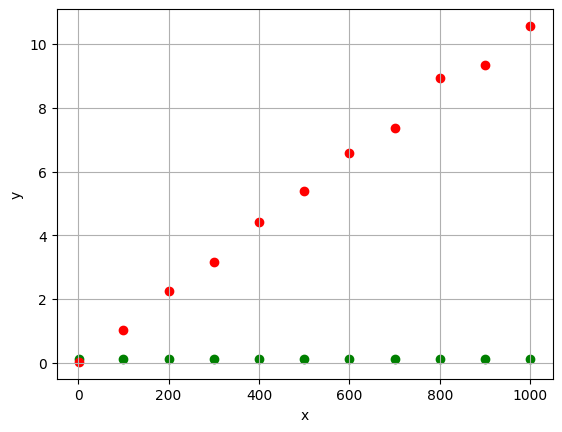

In [145]:
vis.clear()
vis.add_grid()
Graham_points=[]
Jarvis_points=[]
new_points=CreatePoints(997,3)
time_Graham = GenerateResultGraham(new_points)
Graham_points.append((3,time_Graham))
time_Jarvis = GenerateResultJarvis(new_points)
Jarvis_points.append((3,time_Jarvis))
for k in range (100,1100,100):
    new_points=CreatePoints(1000-k,k)
    time_Graham = GenerateResultGraham(new_points)
    Graham_points.append((k,time_Graham))
    time_Jarvis = GenerateResultJarvis(new_points)
    Jarvis_points.append((k,time_Jarvis))
vis.add_point(Graham_points, color=["green"])
vis.add_point(Jarvis_points, color=["red"])
vis.show()

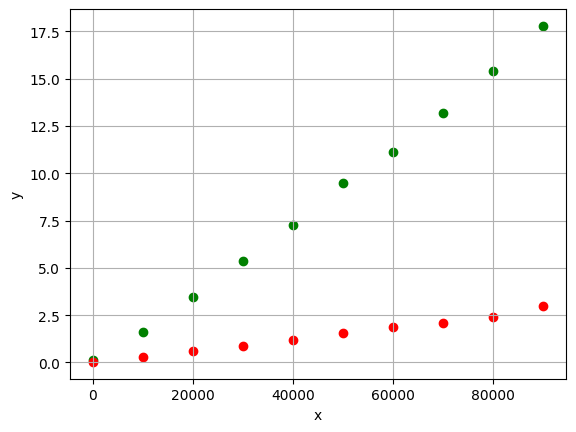

In [146]:
vis.clear()
vis.add_grid()
Graham_points=[]
Jarvis_points=[]
new_points=CreatePoints(997,3)
time_Graham = GenerateResultGraham(new_points)
Graham_points.append((3,time_Graham))
time_Jarvis = GenerateResultJarvis(new_points)
Jarvis_points.append((3,time_Jarvis))
for n in range (10000,100000,10000):
    new_points=CreatePoints(n-3,3)
    time_Graham = GenerateResultGraham(new_points)
    Graham_points.append((n, time_Graham))
    time_Jarvis = GenerateResultJarvis(new_points)
    Jarvis_points.append((n, time_Jarvis))
vis.add_point(Graham_points, color=["green"])
vis.add_point(Jarvis_points, color=["red"])
vis.show()

In [147]:
def orient_decimal (a,b,c):
    eps=eps=1e-30
    new_a=(decimal.Decimal(a[0]),decimal.Decimal(a[1]))
    new_b=(decimal.Decimal(b[0]),decimal.Decimal(b[1]))
    new_c=(decimal.Decimal(c[0]),decimal.Decimal(c[1]))
    det=(new_b[0]-new_a[0])*(new_c[1]-new_b[1])-(new_b[1]-new_a[1])*(new_c[0]-new_b[0])
    if abs(det)<eps:
        return 0
    elif det>0:
        return 1
    else:
        return -1

def orient_float (a,b,c):
    eps=eps=1e-8
    det=(b[0]-a[0])*(c[1]-b[1])-(b[1]-a[1])*(c[0]-b[0])
    if abs(det)<eps:
        return 0
    elif det>0:
        return 1
    else:
        return -1


a=(1,1)
b=(1,2)
c=(2,3)
time_decimal=0
time_float=0
for i in range (int(1e6)):
    start_time_decimal = time.time()
    _ = orient_decimal(a,b,c)
    end_time_decimal = time.time()
    time_decimal += end_time_decimal - start_time_decimal
    start_time_float = time.time()
    _ = orient_float(a,b,c)
    end_time_float = time.time()
    time_float += end_time_float - start_time_float

table_orient = pd.DataFrame([time_decimal,time_float], index=["Decimal","Float"], columns=["Czas"])
display (table_orient)



,Czas
Decimal,3.731544
Float,0.626052


WNIOSKI HERE  
W sprawozdaniu napisz, czy Twój program działał poprawnie dla wszystkich zbiorów
danych oraz opisz krótko wnioski dotyczące działania algorytmu dla poszczególnych
zbiorów. Napisz, dlaczego wg Ciebie zaproponowano takie zbiory punktów? Które ze
zbiorów mogły stwarzać problemy w działaniu algorytmów? Jeśli tak, to jakie i
dlaczego? Porównaj czasy działania obu algorytmów w zależności od liczby punktów
w poszczególnych zbiorach (A, B, C, D). Dołącz wybrane, istotne ilustracje.

Bibliografia:
- Wprowadzenie do algorytmów wydanie 3, Thomas H. Cormen, Charles E. Leiserson, Ronald L. Rivest, Stein Clifford


In [148]:
# Wszystko powyżej lub w sprawozdaniu